In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import kaepora as kpora
import flux_calibration as fc
import composite
import numpy as np
import pysynphot
from astropy import units as u
from scipy.interpolate import interp2d

In [9]:
# query_test = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where (Flux_Cal_Scale > 0 and Spectra.SN = '2007on') or (Spectra.SN = '2004ef' and Flux_Cal_Scale > 0)"
# query_test = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where Spectra.SN = '2004ef' and Flux_Cal_Scale > 0"
query_test = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where Spectra.SN = '2004dt' and Flux_Cal_Scale > 0"
# query_test = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where source='csp'"
# query_test = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where (Flux_Cal_Scale > 0 and Spectra.SN = '2008bf') or (Spectra.SN = '2005m' and Flux_Cal_Scale > 0)"
spec_array_test = kpora.grab(query_test, multi_epoch = True, make_corr = True, verbose=True)
for spec in spec_array_test:
    spec = fc.MW_correction(spec, undo=True)
spec_array_test = composite.prelim_norm(spec_array_test) #flux cal scalings are based off pre-MW corrected, normalized spectra

Using: ../data/kaepora_v1.1_wNIRdata.db
20 Total Spectra found
0 flagged spectra removed 20 spectra left
0 spectra of peculiar Ias removed 20 spectra left
20 spectra of SNe that have host reddening corrections
Arrays cleaned
Name Filename Source SNR Phase MJD MJD_max z Host Morphology Minwave Maxwave
2004dt sn2004dt-20040910.358-ui-corrected.flm bsnip 50.22795169394956 21.619448285332485 53258.358 0.01973 10.0 3298.0 10246.0
2004dt sn2004dt-20040924.400-ui-corrected.flm bsnip 46.744300106585854 35.389760034522254 53272.4 0.01973 10.0 3308.0 10246.0
2004dt sn2004dt-20041001-ui.flm bsnip 15.927182178127193 42.32492914791513 53279.472 0.01973 10.0 3318.0 10148.0
2004dt sn2004dt-20041013.410-ui-corrected.flm bsnip 5.129243212179675 54.031949633731884 53291.41 0.01973 10.0 3318.0 10246.0
2004dt sn2004dt-20041114-br.flm bsnip 34.61433742918535 85.01073813656744 53323.0 0.01973 10.0 3138.0 9168.0
2004dt sn2004dt-20041212.391-br.flm bsnip 32.18421676929311 112.85242171947984 53351.391 0.01973 

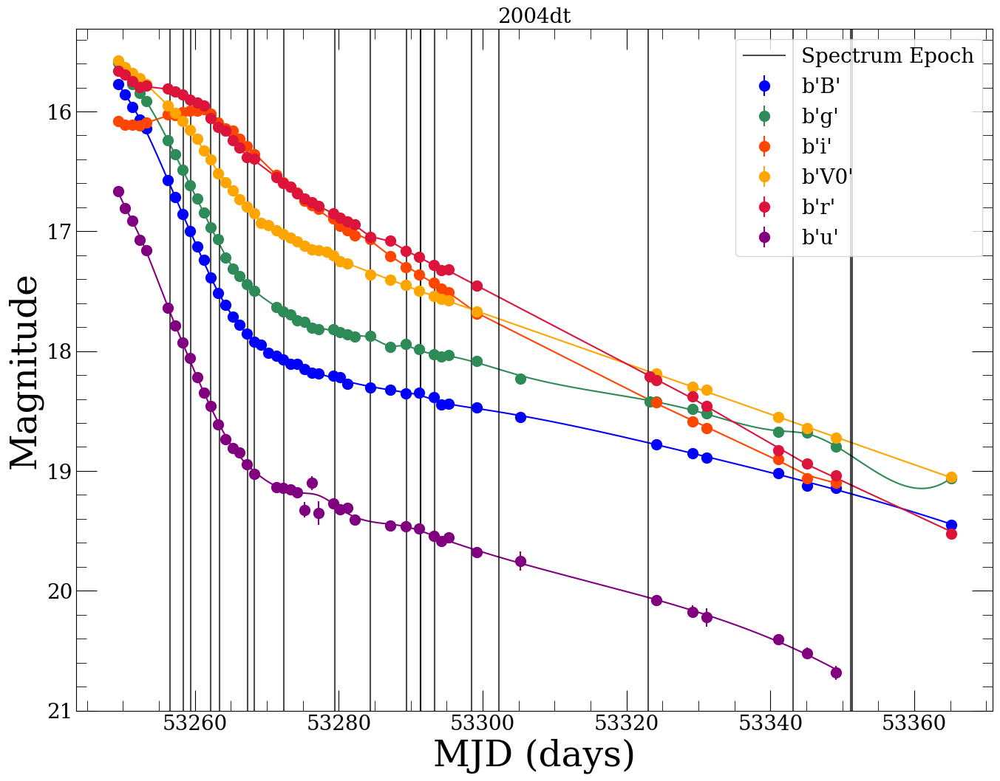

In [10]:
phot = spec_array_test[0].event_data['Homogenized_Photometry']
mjds = []
for spec in spec_array_test:
    mjds.append(spec.mjd)
fc.plot_light_curves(phot, spec.name, spec_dates = mjds, fit=True)

In [110]:
for spec in spec_array_test:
    spec = fc.MW_correction(spec, undo=True)

In [111]:
spec_array_test = composite.prelim_norm(spec_array_test)
for spec in spec_array_test:
    vbs = fc.valid_bands(spec)
    scale, mags_from_phot = fc.scale_flux_to_photometry_pysyn(spec, vbs)
    if ~np.isnan(scale):
        spec.scale_to_phot = scale
    else:
        spec.scale_to_phot = None

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in 

Warning, 49 of 3430 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 49 of 3430 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined bins

Warning, 8 of 3018 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 8 of 3018 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset

Warning, 97 of 2935 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 97 of 2935 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset 

Warning, 10 of 1856 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 10 of 1856 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined b

Warning, 21 of 1873 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 21 of 1873 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined b

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in 

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in 

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in 

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in 

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in 

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in 

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in 

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in 

Warning, 2 of 1856 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 2 of 1856 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined bin

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in 

Warning, 18 of 1855 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 18 of 1855 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined b

Warning, 30 of 1852 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 30 of 1852 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined b

Warning, 22 of 1852 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 22 of 1852 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined b

Warning, 12 of 1500 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 12 of 1500 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 12 of 1500 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used inste

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the

Warning, 22 of 2416 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 22 of 2416 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset 

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the

Warning, 50 of 2567 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_g_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_r_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/sdss_i_005_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 50 of 2567 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined bins

In [112]:
for spec in spec_array_test:
    print (spec.scale_to_phot)
    spec.flux *= spec.scale_to_phot
    spec.ivar /= spec.scale_to_phot**2
    

0.14455026366314494 0.0065362157993995315 22.115283231074542
1.6171874999999694e-15
1.2812499999999683e-15
2.1289062499996448e-16
1.7382812499996435e-16
1.171874999999968e-15
2.624999999999973e-15
1.2187499999999682e-15
1.3749999999999687e-15
1.515624999999969e-15
1.6484374999999697e-15
1.7656249999999702e-15
1.9062499999999706e-15
1.7656249999999702e-15
1.7890624999999703e-15
1.81249999999997e-15
1.2968749999999684e-15
4.296874999999653e-16
2.929687499999648e-16
2.4609374999996464e-16
1.4999999999999692e-15
2.1093749999999713e-15
1.67968749999997e-15
1.937499999999971e-15
1.0898437499999677e-15


In [113]:
# for spec in spec_array_test:
#     print spec.filename, spec.other_spectral_data['Flux_Cal_Scale']
#     spec.flux *= spec.other_spectral_data['Flux_Cal_Scale']
#     spec.ivar /= spec.other_spectral_data['Flux_Cal_Scale']**2.

In [114]:
for spec in spec_array_test:
    spec = fc.MW_correction(spec, undo=False)
    spec = fc.host_correction(spec, undo=False)

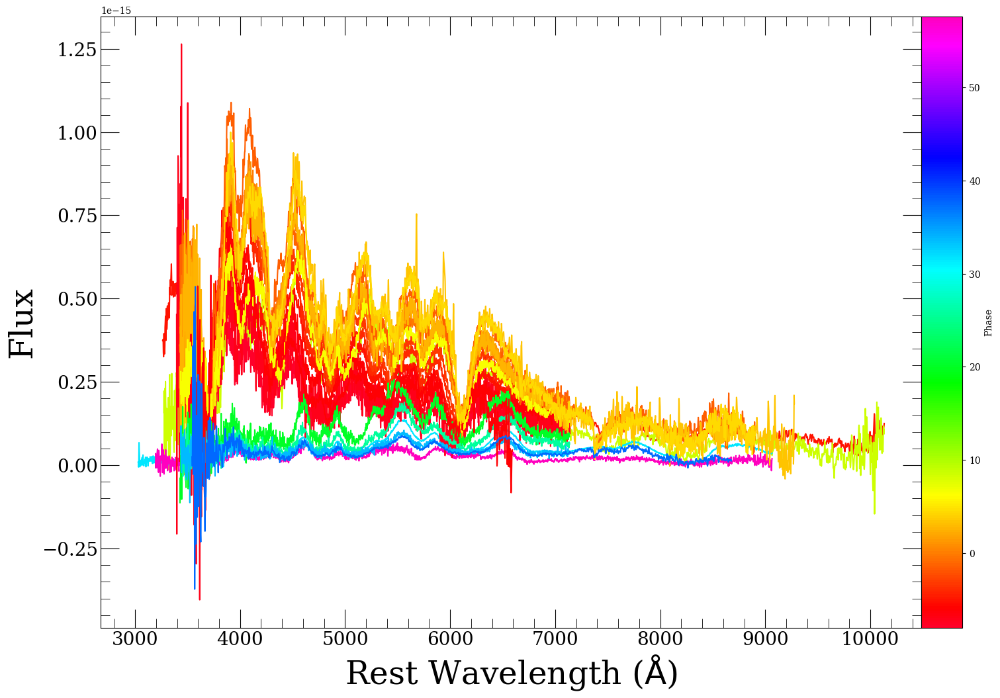

In [115]:
fc.plot_spectra(spec_array_test)

2004ef 1.39 0.030985
sn2004ef-20040910.310-ui-corrected.flm 168590921271865.72
sn2004ef-20040924.302-ui-corrected.flm 168590921271865.72
sn2004ef-20041018-br-corrected.flm 168590921271865.72
sn2004ef-20041114-br.flm 168590921271865.72
sn2004ef-20040907.30-fast.flm 168590921271865.72
sn2004ef-20040908.35-fast.flm 168590921271865.72
sn2004ef-20040909.24-fast.flm 168590921271865.72
sn2004ef-20040910.27-fast.flm 168590921271865.72
sn2004ef-20040911.34-fast.flm 168590921271865.72
sn2004ef-20040912.28-fast.flm 168590921271865.72
sn2004ef-20040914.18-fast.flm 168590921271865.72
sn2004ef-20040915.30-fast.flm 168590921271865.72
sn2004ef-20040916.34-fast.flm 168590921271865.72
sn2004ef-20040917.27-fast.flm 168590921271865.72
sn2004ef-20040918.28-fast.flm 168590921271865.72
sn2004ef-20040922.22-fast.flm 168590921271865.72
sn2004ef-20041006.17-fast.flm 168590921271865.72
sn2004ef-20041012.14-fast.flm 168590921271865.72
sn2004ef-20041020.15-fast.flm 168590921271865.72
SN04ef_040909_b01_CLA_LD.dat 1

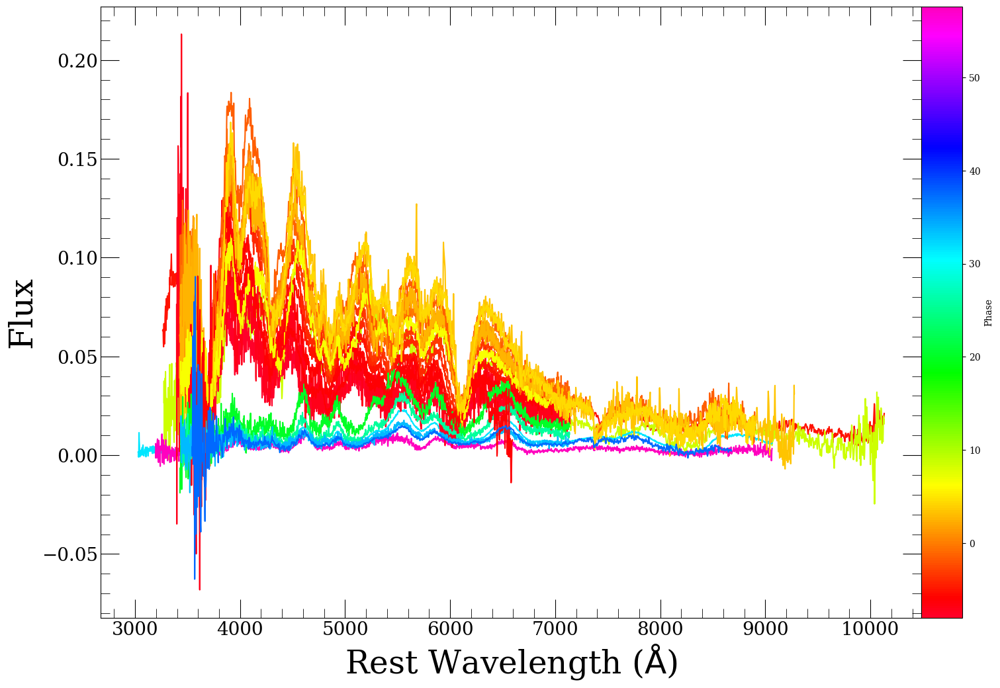

0.028199032982482736 0.0012068305220306256 23.36619141437917


In [116]:
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
cosmo = FlatLambdaCDM(H0=73.24 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

abs_scales = {}
for spec in spec_array_test:
    if spec.name not in abs_scales.keys():
        print (spec.name, spec.dm15, spec.event_data['Redshift'])
        D = cosmo.luminosity_distance(spec.event_data['Redshift']).value
        scale = 10**((5.-5.*np.log10(D*1e6))/(-2.5))
        abs_scales[spec.name] = scale

for spec in spec_array_test:
    print (spec.filename, abs_scales[spec.name])
    spec.flux *= abs_scales[spec.name]
    spec.ivar /= abs_scales[spec.name]**2.
fc.plot_spectra(spec_array_test)

In [117]:
from mpl_toolkits.mplot3d import axes3d, Axes3D

In [118]:
phases = []
waves = []
fluxes = []
colors = []
s_m = fc.make_colorbar(spec_array_test)
for spec in spec_array_test:
    waves.append(spec.wavelength)
    fluxes.append(spec.flux)
    phases.append(np.full(len(spec_array_test[0].wavelength), spec.phase))
    colors.append(s_m.to_rgba(spec.phase))
phases = np.asarray(phases)
waves = np.asarray(waves)
fluxes = np.asarray(fluxes)

In [119]:
fig = plt.figure(figsize=(20,15))
ax = Axes3D(fig)
ax.plot_wireframe(phases, waves, fluxes, rstride=1, cstride=10000, alpha=1, color = colors)
ax.set_ylim([3000,10000])
ax.set_xlim([-10,10])
ax.view_init(10, 20)
plt.show()

<Figure size 2000x1500 with 0 Axes>

In [120]:
import gp2d_george as gp2d
import prep 

In [121]:
def interpspec(spec_array,dw=100,waverange=[4000,8000],plot=False):
    specnew = {}
    phases = []
    for spec in spec_array:
        snew = {}
        wave = spec.wavelength[spec.x1:spec.x2]
        flux = spec.flux[spec.x1:spec.x2]
        ivar = spec.ivar[spec.x1:spec.x2]
        if plot:
            plt.plot(wave,flux)
        output, scale, var_final = prep.Interpo_flux_conserving(wave,flux,ivar,dw=dw)
        wave,flux,ivar = output[0],output[1],output[2]
        
        idx = np.array((wave>waverange[0]) & (wave<waverange[1]))
        idx_nan = ~np.isnan(flux)
        
        idx_nan_w1 = (wave<spec.wavelength[spec.x1])
        flux[idx_nan_w1] = np.median(flux[idx_nan][0:10])
        print (np.median(flux[idx_nan][0:10]))
        ivar[idx_nan_w1] = ivar[idx_nan][0]/1e3
        
        idx_nan_w2 = (wave>spec.wavelength[spec.x2])
        flux[idx_nan_w2] = np.median(flux[idx_nan][-10:])
        print (np.median(flux[idx_nan][-10:]))
        ivar[idx_nan_w2] = ivar[idx_nan][-1]/1e3
        
        snew['wavelength_interp'] = wave[idx]
        snew['flux_interp'] = flux[idx]
        snew['ivar_interp'] = ivar[idx]
        
#         flux[idx_nan] = 0.
#         ivar[idx_nan] = 0.
        
        phase = spec.phase
        phases.append(phase)
        
        specnew[phase] = snew
        if plot:
            plt.plot(wave[idx],flux[idx])
#             plt.plot(wave,flux)
        plt.title(str(phase))
        plt.show()
    return specnew, np.sort(phases), wave[idx]

[3030.0, 10134.0]
3.5057625782140747
0.41312914498287057


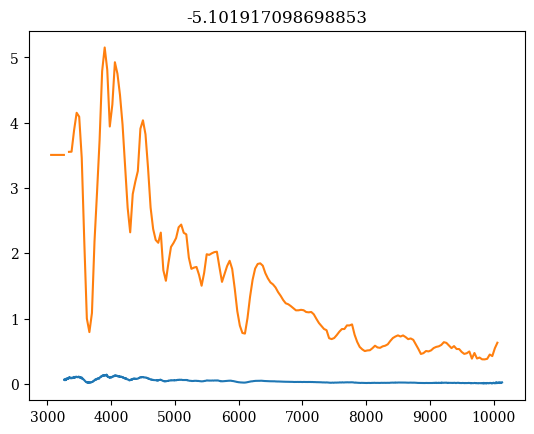

1.2413897667454696
0.22199926966781736


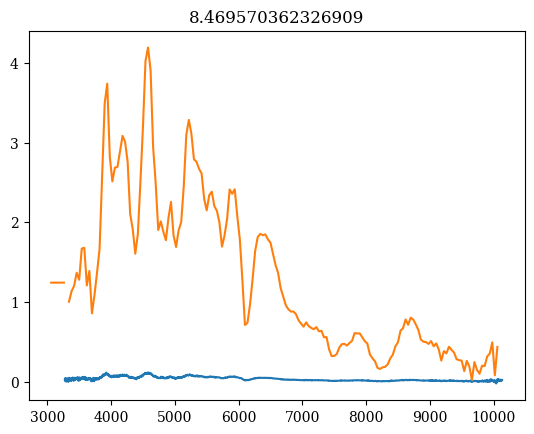

0.09244439867064058
0.37853878558836285


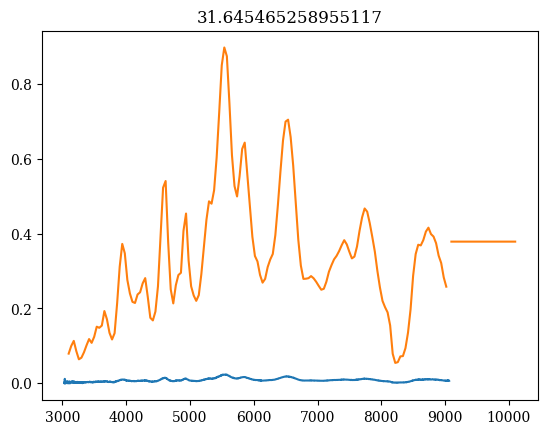

1.2681406838101972
0.8504573305300398


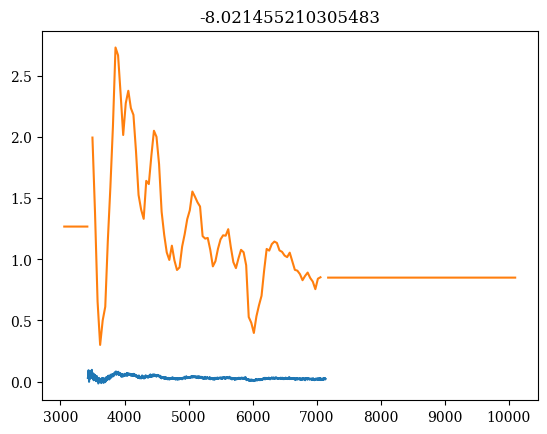

1.900254651780565
0.9143234518698526


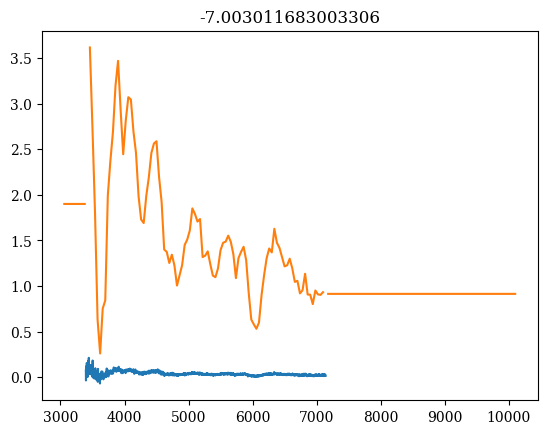

2.0586496679580852
1.0722432393699899


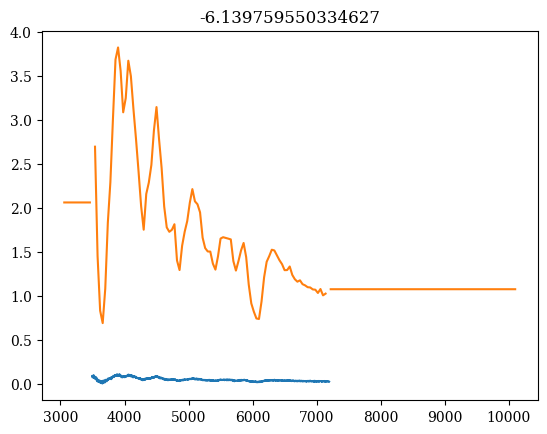

2.1573688294407205
1.205312706402402


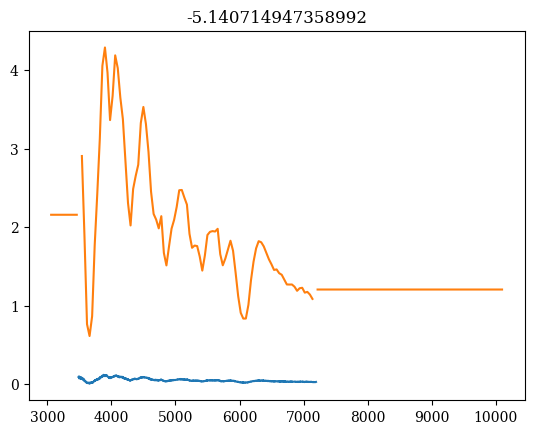

2.6206608640786593
1.2453803111107404


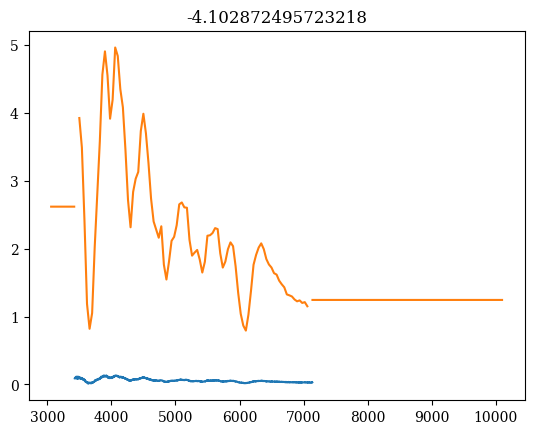

2.968329690444893
1.3212610700516196


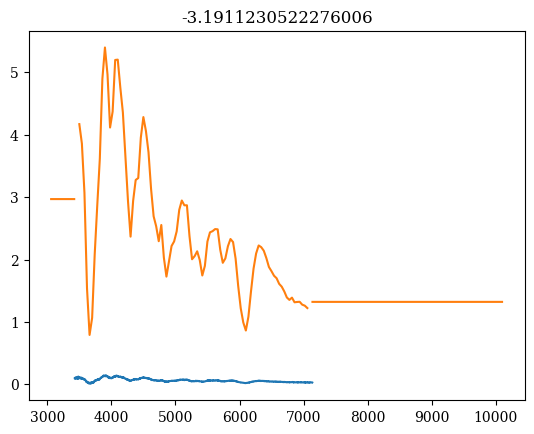

3.258443294330686
1.4806525976540788


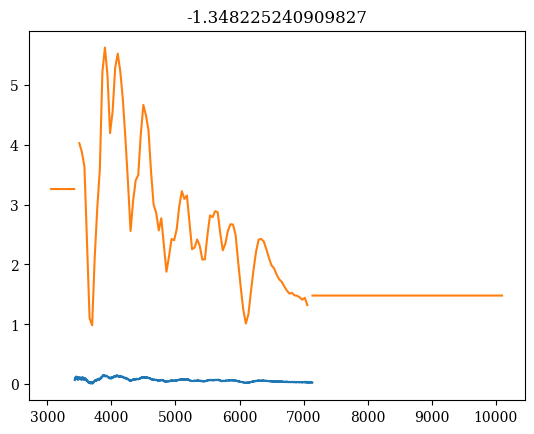

3.3447313058110963
1.2540491213794605


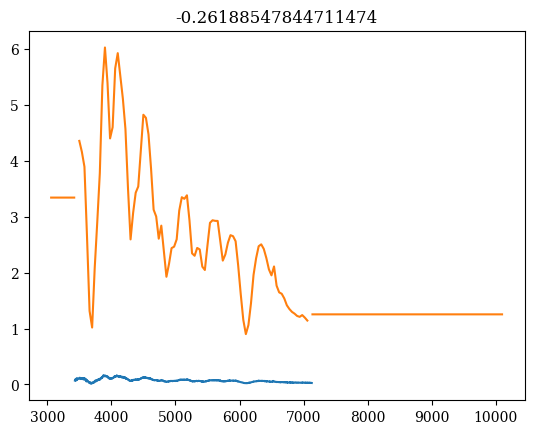

2.999309405298299
1.3174052948209591


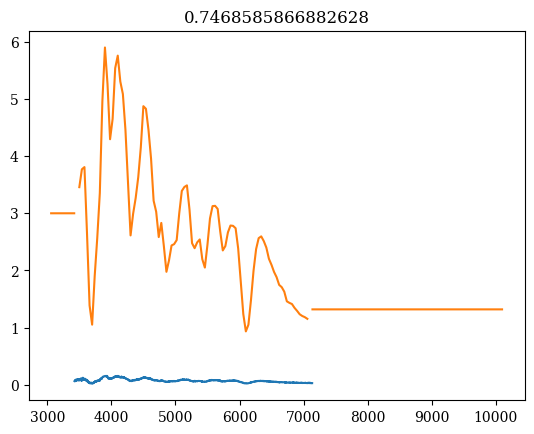

2.959910628374294
1.3409801939364767


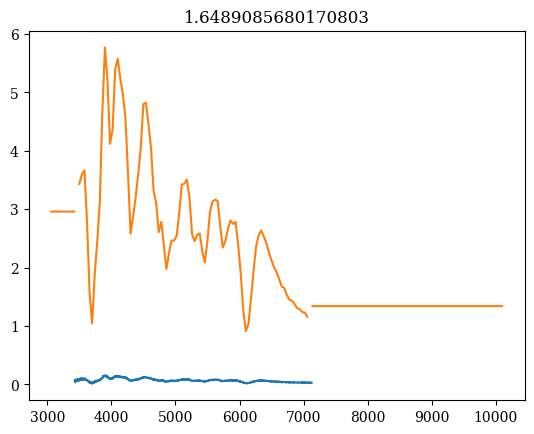

2.8102903147606337
1.2895598742594838


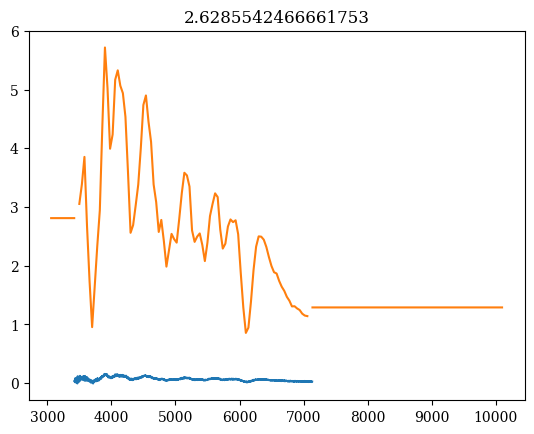

1.8911775056403286
1.1338642853851226


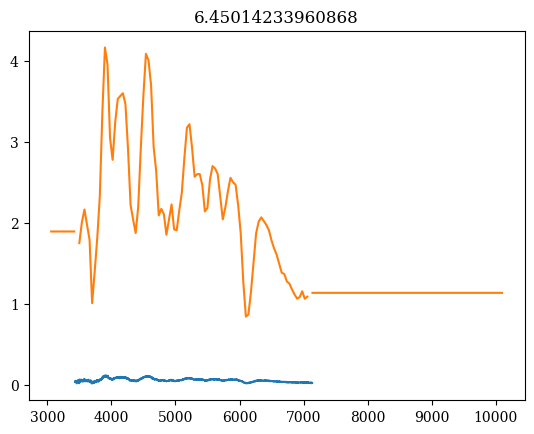

0.517030135587825
0.6227506577580998


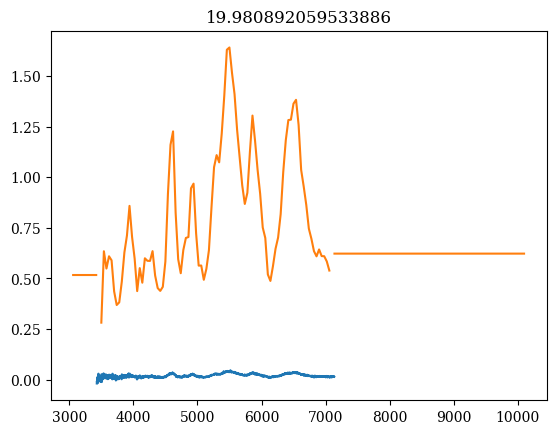

0.2472575832749681
0.497346328646298


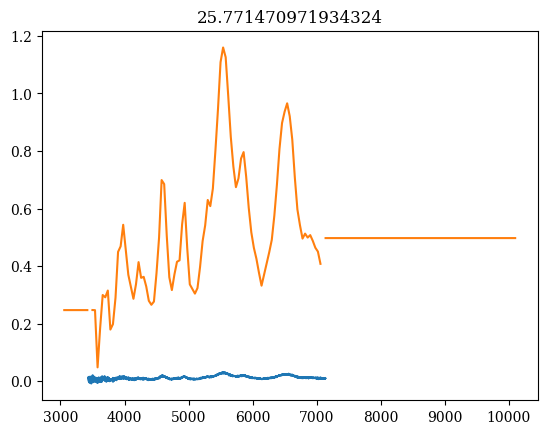

0.2582751148460407
0.23912160860384618


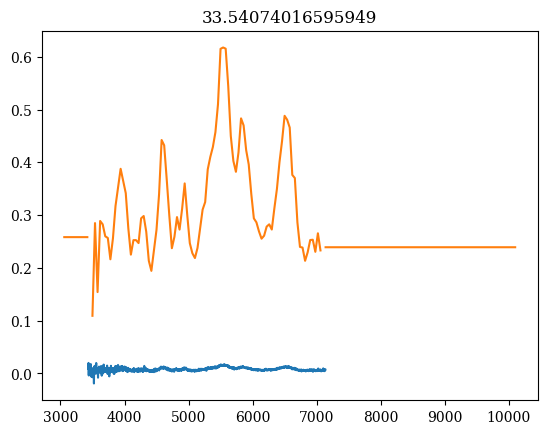

3.7473214325561184
1.0569278052584585


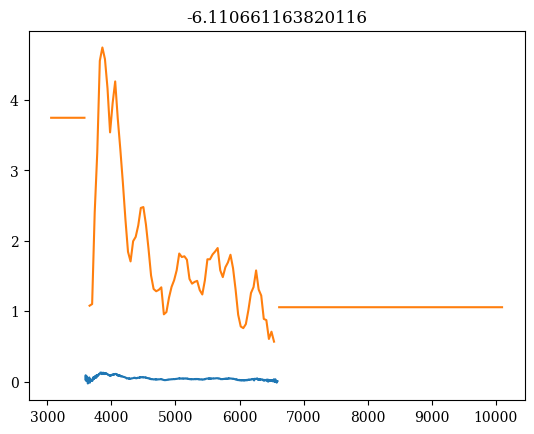

6.044165232525733
0.8167366360097201


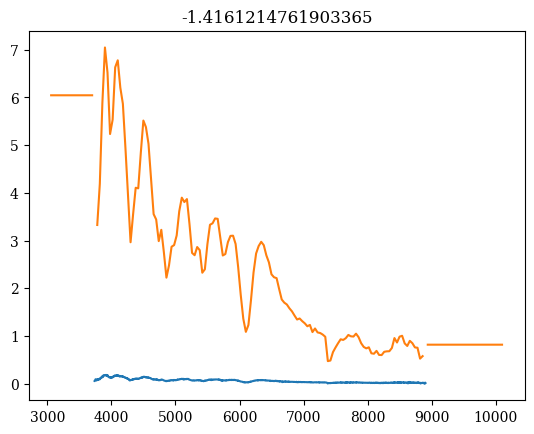

4.001398024687895
0.5013672493639245


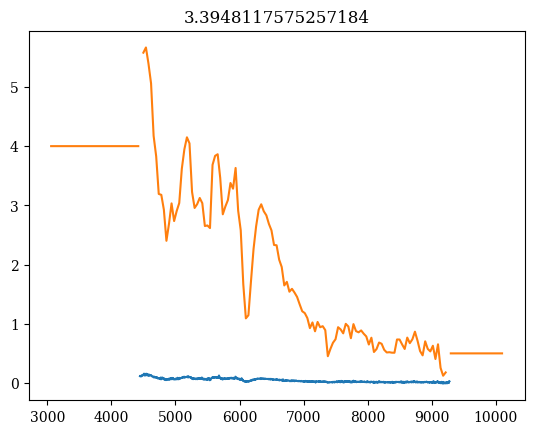

4.995624330452886
0.8600950698588106


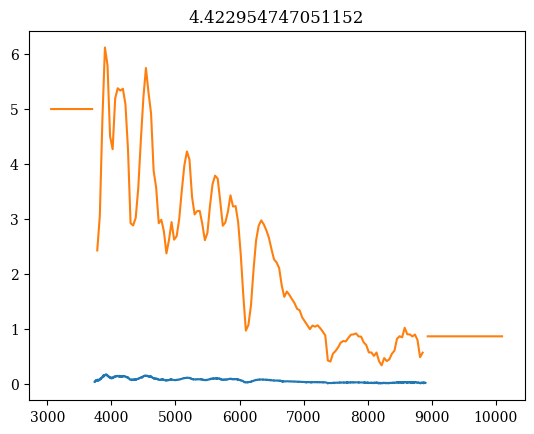

0.36858080794169973
0.09725618369880006


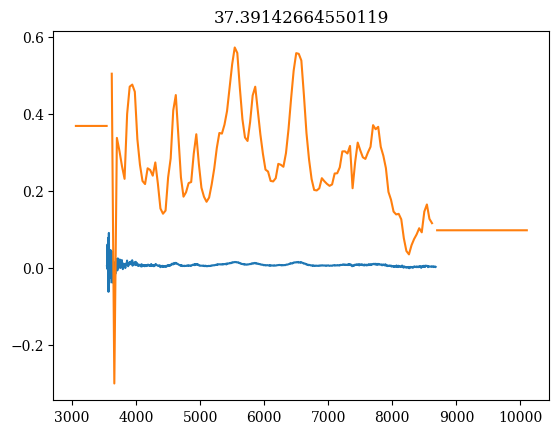

[-8.02145521 -7.00301168 -6.13975955 -6.11066116 -5.14071495 -5.1019171
 -4.1028725  -3.19112305 -1.41612148 -1.34822524 -0.26188548  0.74685859
  1.64890857  2.62855425  3.39481176  4.42295475  6.45014234  8.46957036
 19.98089206 25.77147097 31.64546526 33.54074017 37.39142665]
[ 3059.  3099.  3139.  3179.  3219.  3259.  3299.  3339.  3379.  3419.
  3459.  3499.  3539.  3579.  3619.  3659.  3699.  3739.  3779.  3819.
  3859.  3899.  3939.  3979.  4019.  4059.  4099.  4139.  4179.  4219.
  4259.  4299.  4339.  4379.  4419.  4459.  4499.  4539.  4579.  4619.
  4659.  4699.  4739.  4779.  4819.  4859.  4899.  4939.  4979.  5019.
  5059.  5099.  5139.  5179.  5219.  5259.  5299.  5339.  5379.  5419.
  5459.  5499.  5539.  5579.  5619.  5659.  5699.  5739.  5779.  5819.
  5859.  5899.  5939.  5979.  6019.  6059.  6099.  6139.  6179.  6219.
  6259.  6299.  6339.  6379.  6419.  6459.  6499.  6539.  6579.  6619.
  6659.  6699.  6739.  6779.  6819.  6859.  6899.  6939.  6979.  7019.
  7059.  7

In [122]:
spec_arr_new = []
minwaves = []
maxwaves = []
for spec in spec_array_test:
    minwaves.append(spec.wavelength[spec.x1])
    maxwaves.append(spec.wavelength[spec.x2])
wrange = [np.amin(minwaves), np.amax(maxwaves)]
print (wrange)

for spec in spec_array_test:
#     if spec.wavelength[spec.x1]<wrange[0] and spec.wavelength[spec.x2]>wrange[1] and spec.phase < 40:
#         spec_arr_new.append(spec)
    if spec.phase < 40:
        spec_arr_new.append(spec)
# specnew, phases, waves = interpspec(spec_arr_new,dw=100,waverange=wrange,plot=True)
specnew, phases, waves = interpspec(spec_arr_new,dw=40,waverange=wrange,plot=True) #decent for 04ef
print (phases)
print (waves)

In [123]:
def spec2d(spec):
    nwave = np.shape(spec[list(spec.keys())[0]]['wavelength_interp'])[0]
    nphase = len(list(spec.keys()))
    print(nwave,nphase)
    arr2d = np.ones((nphase*nwave,4))
    for i,phase in enumerate(np.sort(list(spec.keys()))):
        arr2d[i*nwave:(i+1)*nwave,0] = [float(phase)]*nwave
        arr2d[i*nwave:(i+1)*nwave,1] = spec[phase]['wavelength_interp']
        arr2d[i*nwave:(i+1)*nwave,2] = spec[phase]['flux_interp']
        arr2d[i*nwave:(i+1)*nwave,3] = spec[phase]['ivar_interp']
    return arr2d 

def spec2d_test(spec):
    nwave = np.shape(spec[list(spec.keys())[0]]['wavelength_interp'])[0]
    nphase = len(list(spec.keys()))
#     print(nwave,nphase)
#     arr2d = np.ones((nphase*nwave,4))
    arr2d = []
    for i,phase in enumerate(np.sort(list(spec.keys()))):
#         print (spec[phase]['flux_interp'])
        nan_locs = np.where(np.isnan(spec[phase]['flux_interp']))[0]
        for nanl in nan_locs:
            if nanl - 5 < 0:
                spec[phase]['flux_interp'][nanl] = np.nanmedian(spec[phase]['flux_interp'][nanl:nanl+5])
            elif nanl + 5 >= len(spec[phase]['flux_interp']):
                spec[phase]['flux_interp'][nanl] = np.nanmedian(spec[phase]['flux_interp'][nanl-5:nanl])
            else: 
                spec[phase]['flux_interp'][nanl] = np.nanmedian(spec[phase]['flux_interp'][nanl-5:nanl+5])
        arr2d.append(spec[phase]['flux_interp'])
#         arr2d[i*nwave:(i+1)*nwave,0] = [float(phase)]*nwave
#         arr2d[i*nwave:(i+1)*nwave,1] = spec[phase]['wavelength_interp']
#         arr2d[i*nwave:(i+1)*nwave,2] = spec[phase]['flux_interp']
#         arr2d[i*nwave:(i+1)*nwave,3] = spec[phase]['ivar_interp']
    return arr2d 

In [124]:
# # print np.transpose([waves,phases])
# spec_arr = spec2d_test(specnew)
# X = []
# for phase in phases:
#     for wave in waves:
#         X.append([phase,wave])
# # X = np.array([[0,0],[2,0],[4,0],[6,0],[8,0],[10,0],[12,0],[14,0],[16,0],[0,2],
# #                     [2,2],[4,2],[6,2],[8,2],[10,2],[12,2],[14,2],[16,2]])
# X = np.asarray(X)

# y = np.ravel(spec_arr)
# # print np.shape(X)
# # print np.shape(y)
# # y = np.array([-54,-60,-62,-64,-66,-68,-70,-72,-74,-60,-62,-64,-66,
# #                     -68,-70,-72,-74,-76])

# x1 = np.linspace(X[:,0].min(), X[:,0].max()) #p
# x2 = np.linspace(X[:,1].min(), X[:,1].max()) #q
# x = (np.array([x1, x2])).T


# kernel = C(1.0, (1e-3, 1e3)) * RBF([5,5], (1e-2, 1e2))
# gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=15)

# # gp.fit(X, y)#very slow

In [125]:
# x1x2 = np.array(list(product(x1, x2)))
# y_pred, MSE = gp.predict(x1x2, return_std=True)

# X0p, X1p = x1x2[:,0].reshape(50,50), x1x2[:,1].reshape(50,50)
# Zp = np.reshape(y_pred,(50,50))

# # alternative way to generate equivalent X0p, X1p, Zp
# # X0p, X1p = np.meshgrid(x1, x2)
# # Zp = [gp.predict([(X0p[i, j], X1p[i, j]) for i in range(X0p.shape[0])]) for j in range(X0p.shape[1])]
# # Zp = np.array(Zp).T

# fig = plt.figure(figsize=(10,8))
# ax = fig.add_subplot(111)
# ax.pcolormesh(X0p, X1p, Zp)

# plt.show()

(23, 177)
[[1.26814068 1.26814068 1.26814068 ... 0.85045733 0.85045733 0.85045733]
 [1.26814068 1.26814068 1.26814068 ... 0.85045733 0.85045733 0.85045733]
 [1.26814068 1.26814068 1.26814068 ... 0.85045733 0.85045733 0.85045733]
 ...
 [0.36858081 0.36858081 0.36858081 ... 0.09725618 0.09725618 0.09725618]
 [0.36858081 0.36858081 0.36858081 ... 0.09725618 0.09725618 0.09725618]
 [0.36858081 0.36858081 0.36858081 ... 0.09725618 0.09725618 0.09725618]]


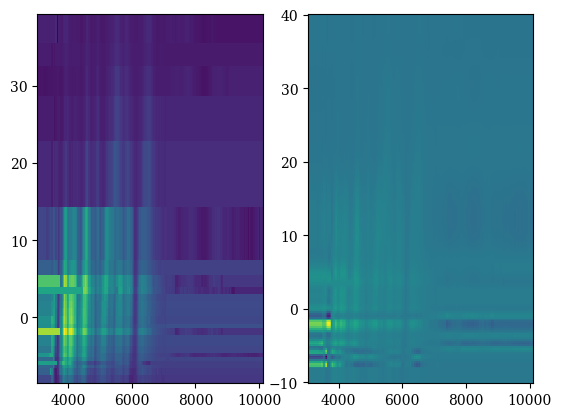

In [126]:
spec_arr = spec2d_test(specnew)
print (np.shape(spec_arr))
# print (spec_arr)

x = waves
y = phases
X, Y = np.meshgrid(x, y)
Z = spec_arr
# Z = np.sin(np.pi*X/2) * np.exp(Y/2)

x2 = waves
y2 = np.linspace(-10, 40, 200)
f = interp2d(x, y, Z, kind='cubic')
Z2 = f(x2, y2)

fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].pcolormesh(X, Y, Z)
X2, Y2 = np.meshgrid(x2, y2)
ax[1].pcolormesh(X2, Y2, Z2)
print (Z2)
plt.show()

-10.0


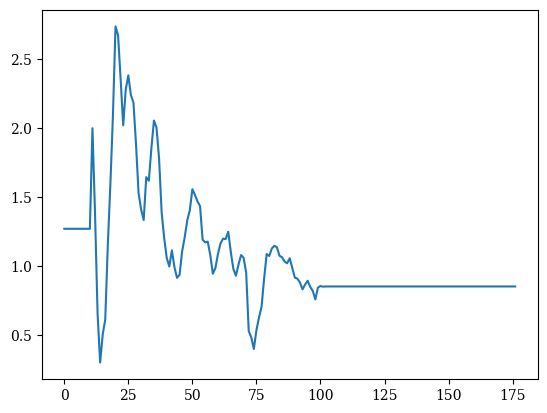

-9.748743718592966


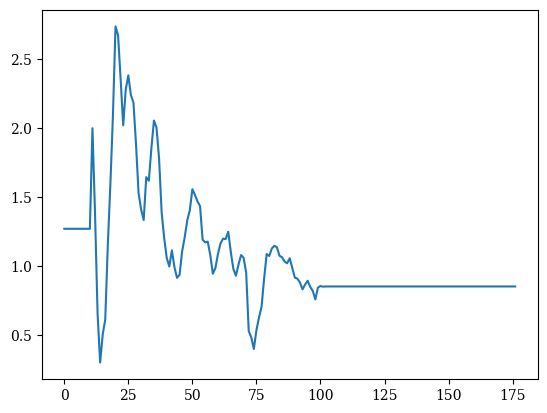

-9.49748743718593


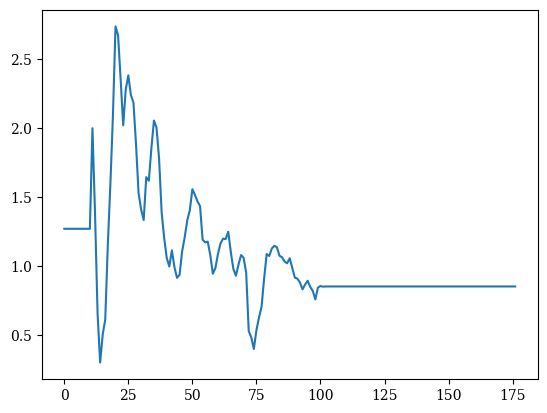

-9.246231155778894


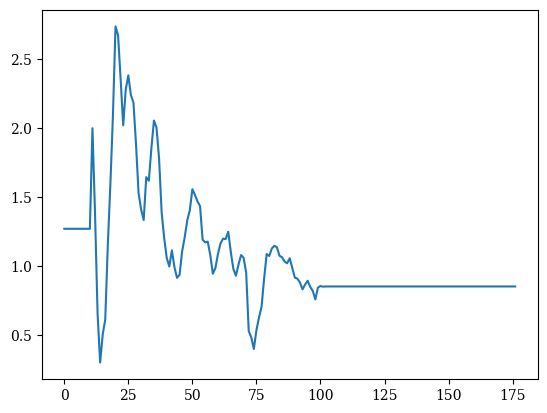

-8.99497487437186


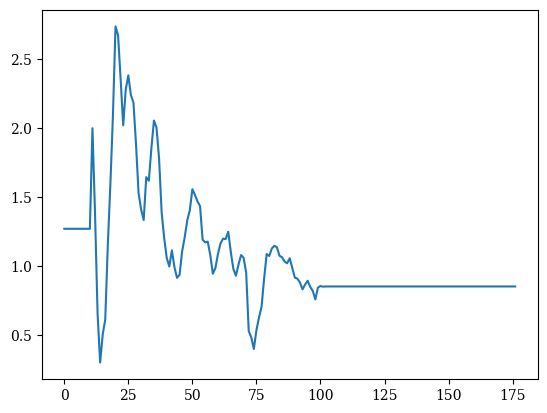

-8.743718592964825


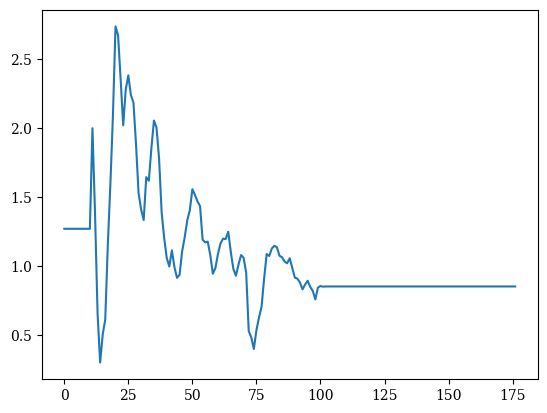

-8.492462311557789


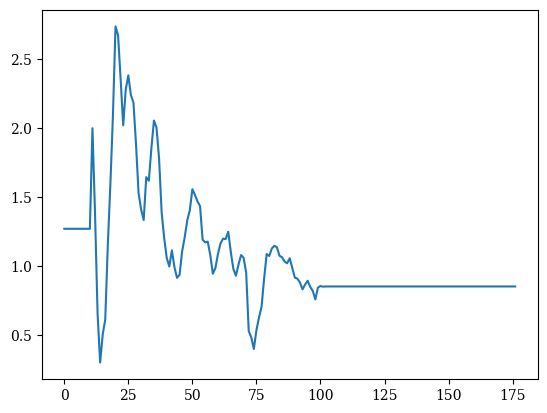

-8.241206030150753


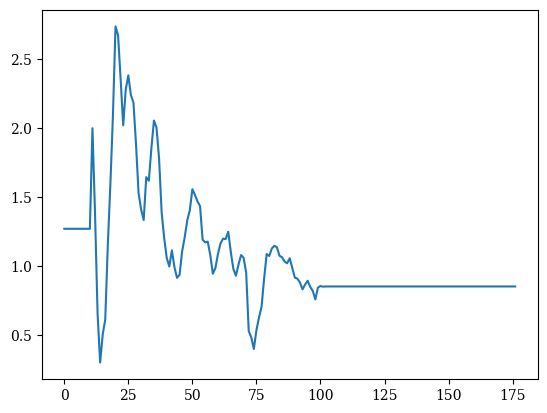

-7.989949748743719


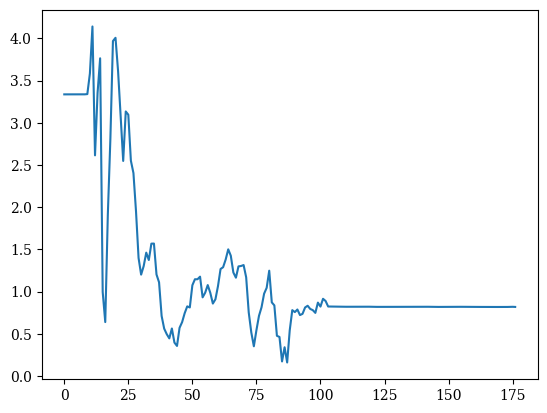

-7.738693467336684


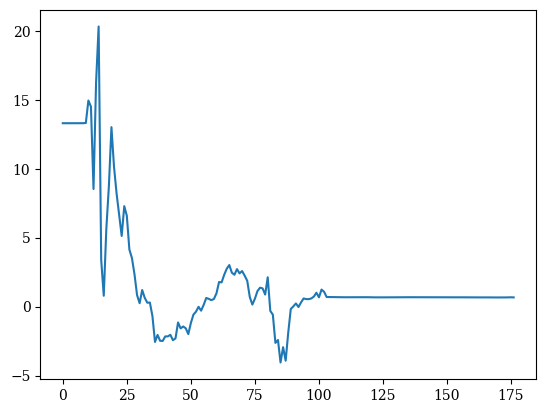

-7.4874371859296485


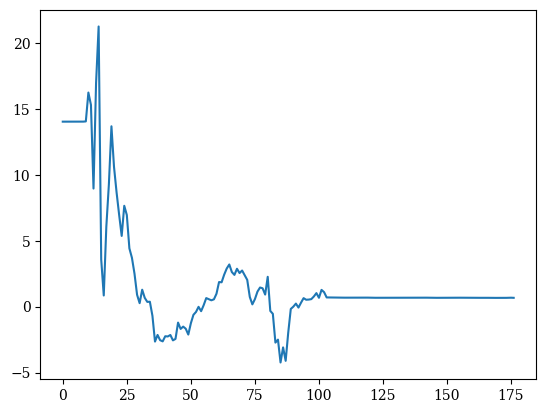

-7.236180904522613


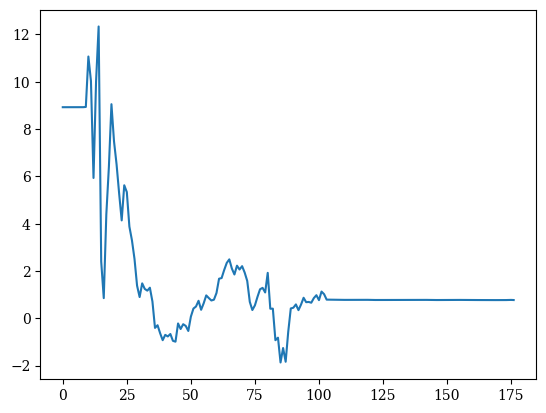

-6.984924623115578


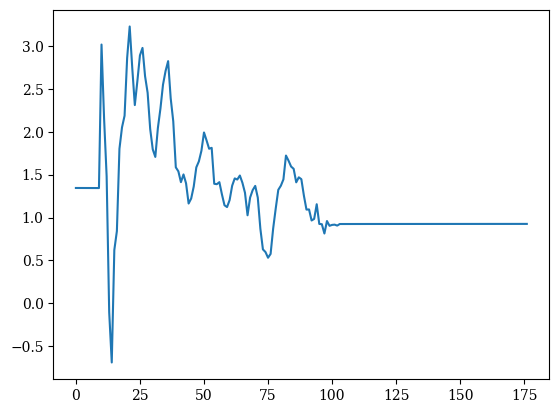

-6.733668341708543


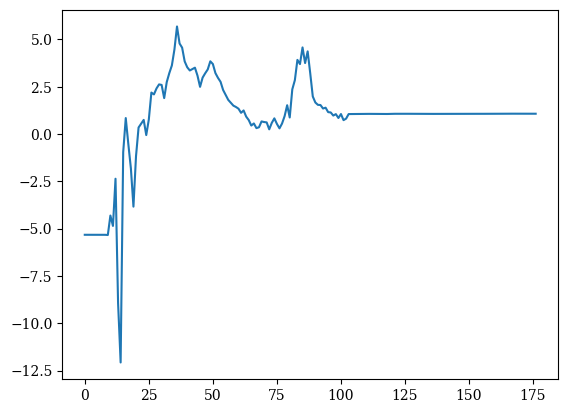

-6.482412060301508


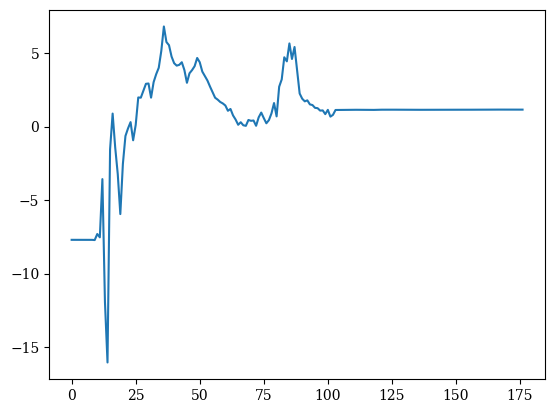

-6.231155778894473


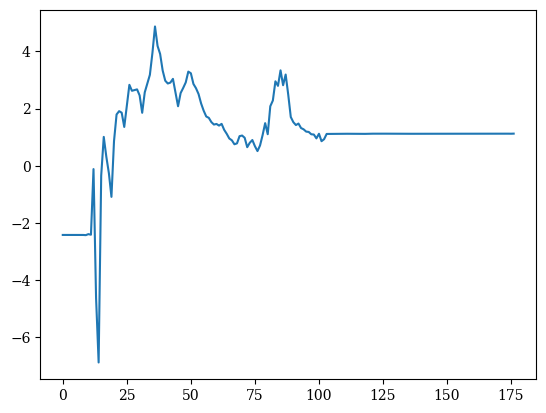

-5.9798994974874375


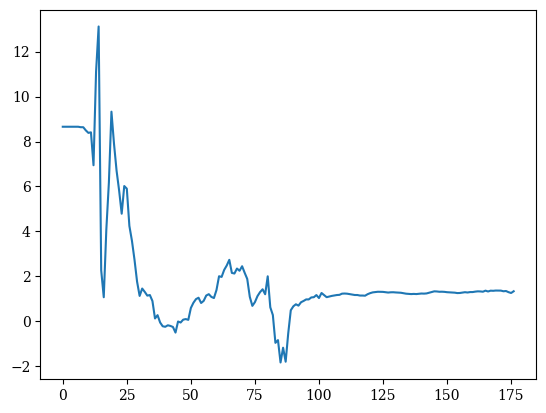

-5.728643216080402


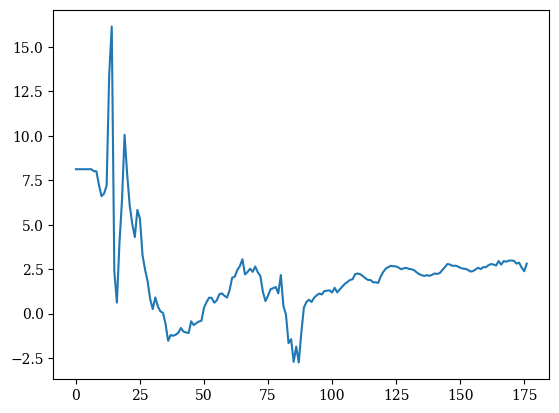

-5.477386934673367


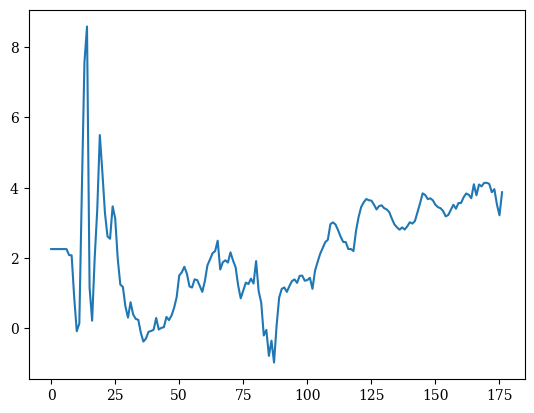

-5.226130653266332


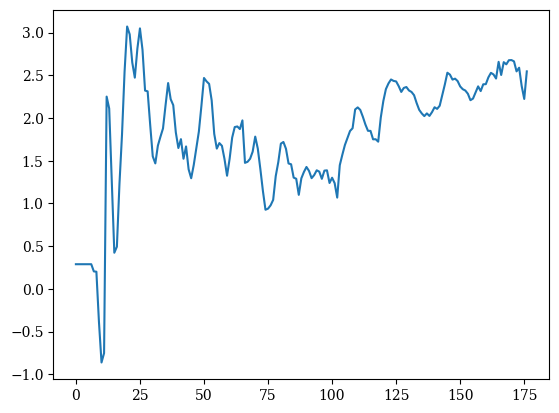

-4.974874371859297


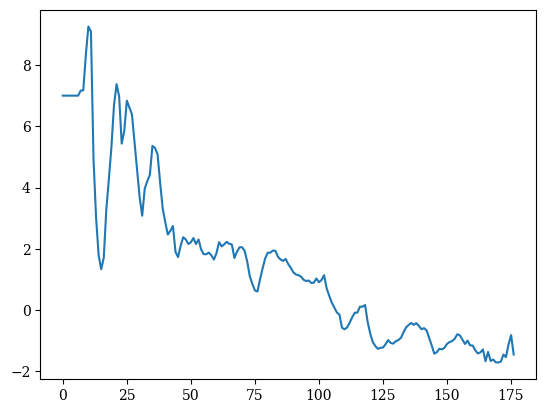

-4.723618090452262


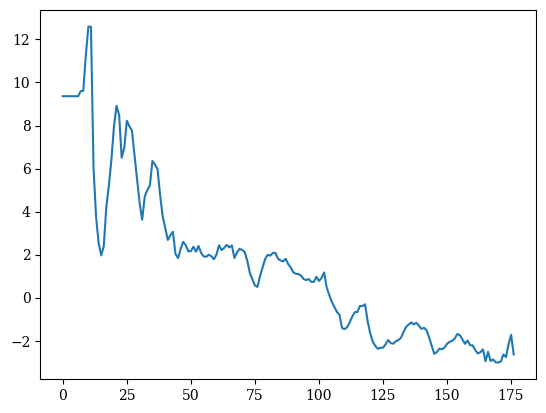

-4.472361809045227


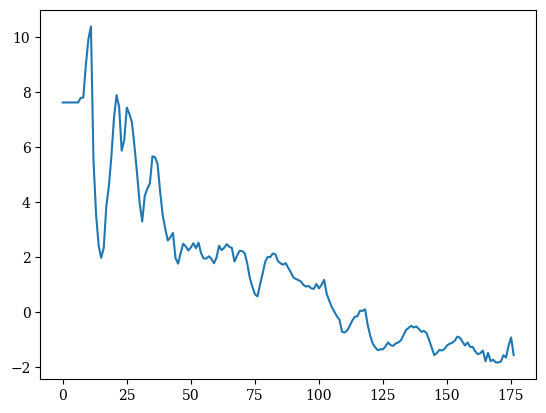

-4.2211055276381915


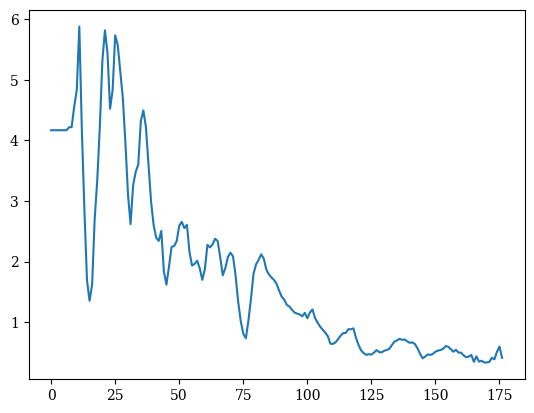

-3.9698492462311563


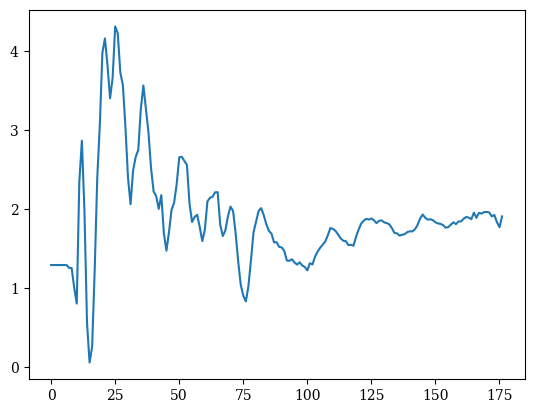

-3.718592964824121


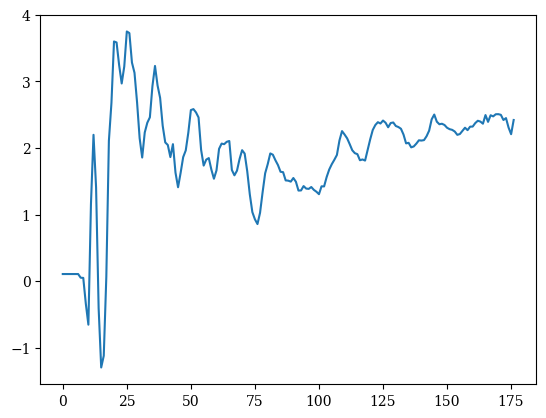

-3.467336683417086


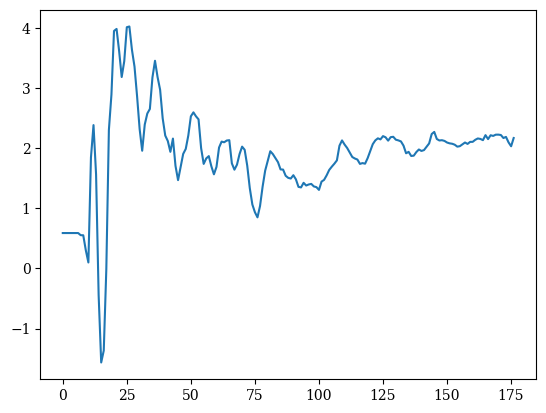

-3.216080402010051


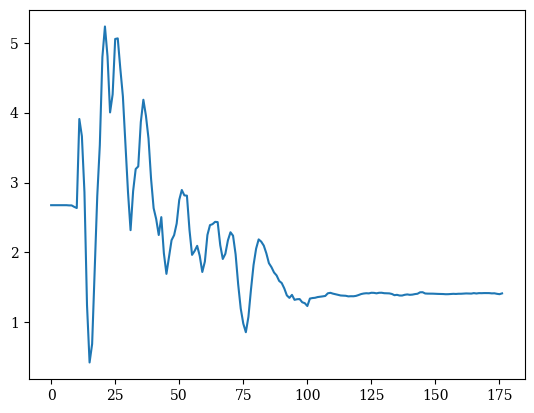

-2.9648241206030157


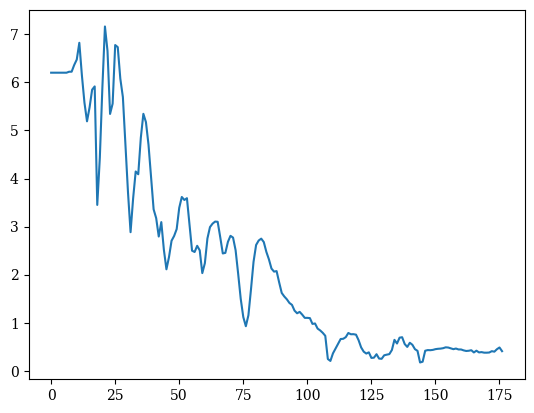

-2.7135678391959805


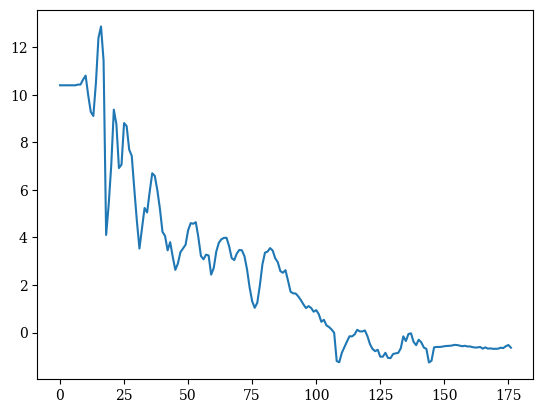

-2.4623115577889454


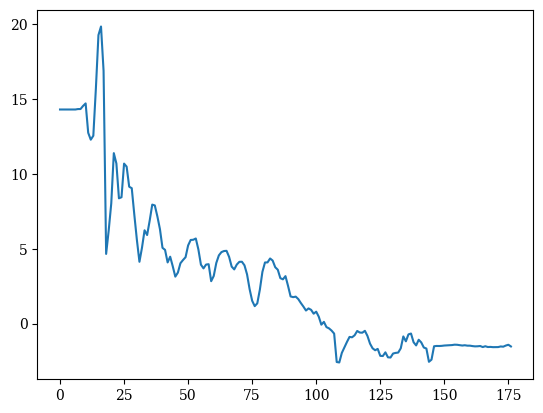

-2.2110552763819102


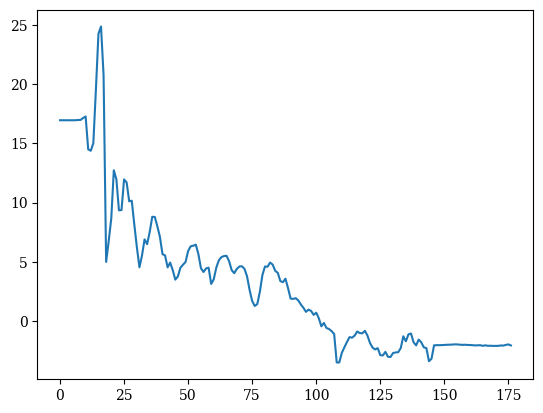

-1.959798994974875


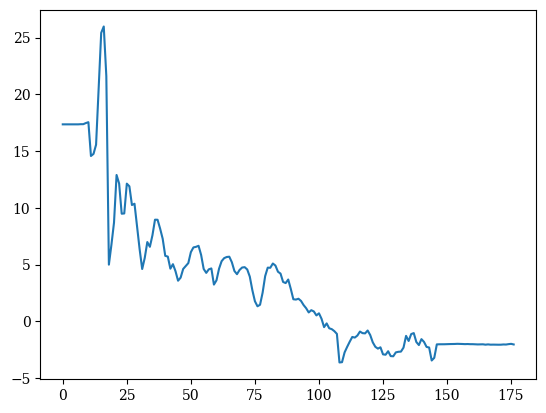

-1.7085427135678408


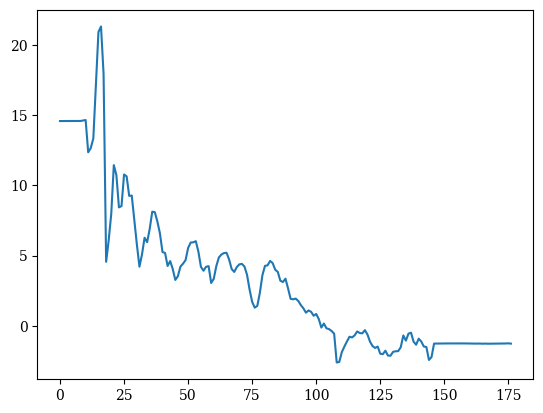

-1.4572864321608048


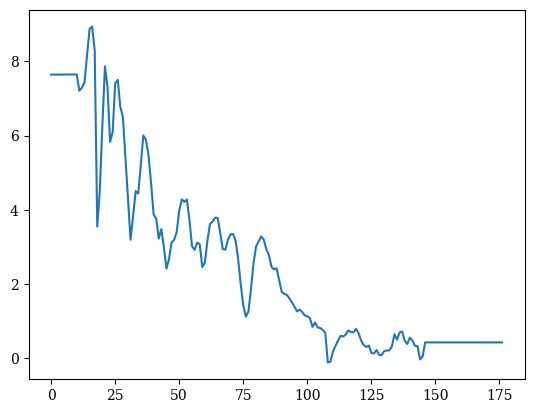

-1.2060301507537687


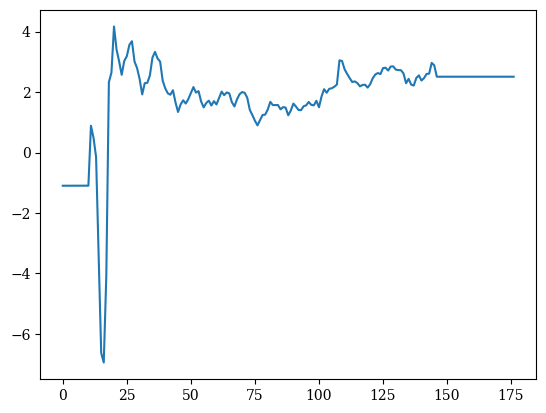

-0.9547738693467345


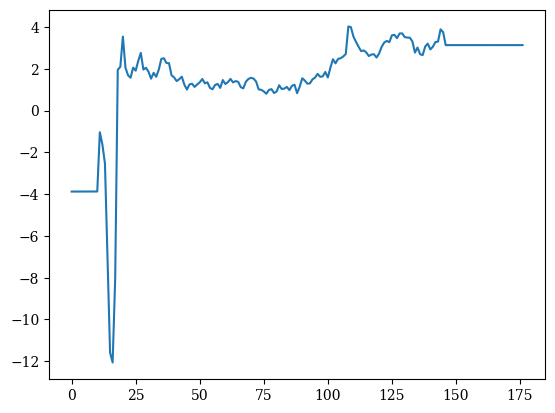

-0.7035175879397002


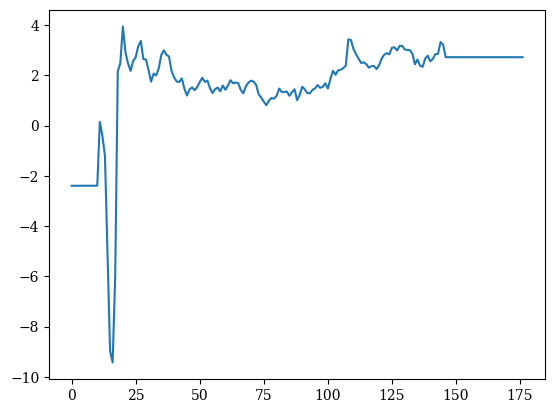

-0.45226130653266416


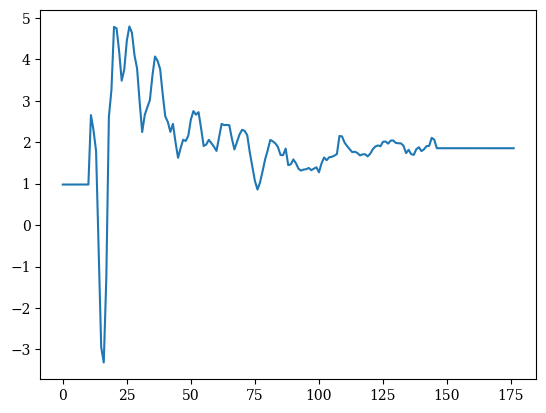

-0.20100502512562812


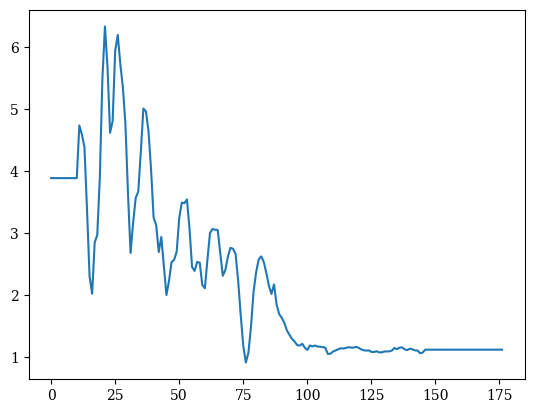

0.05025125628140614


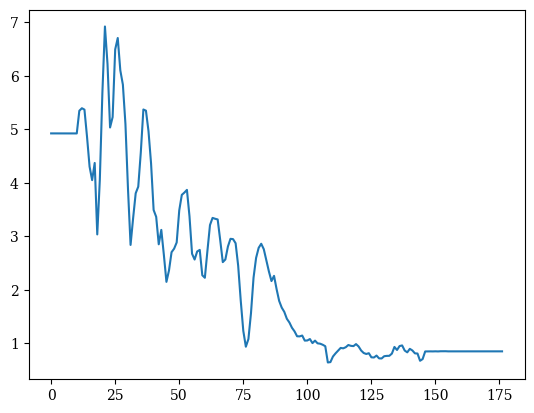

0.3015075376884404


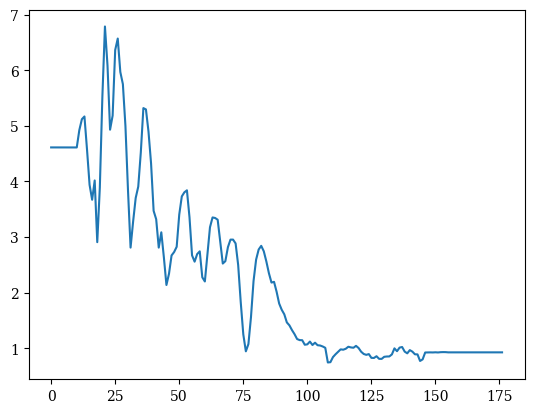

0.5527638190954764


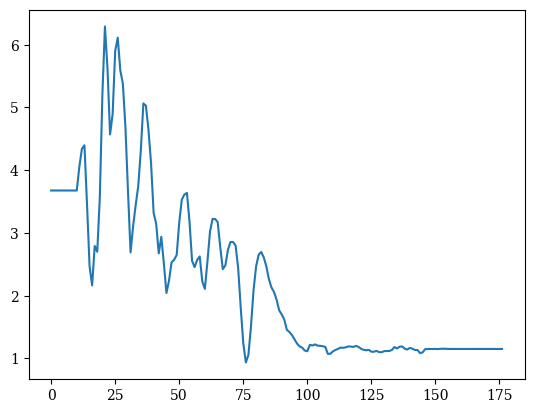

0.8040201005025125


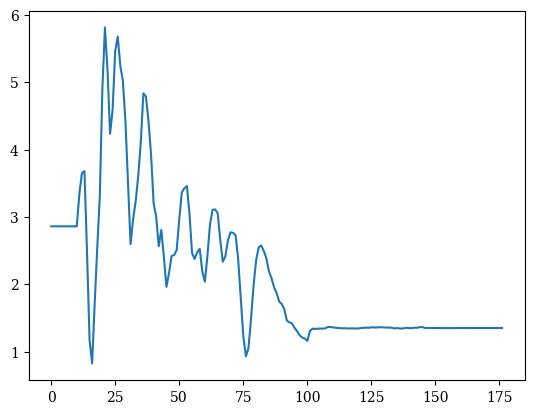

1.0552763819095468


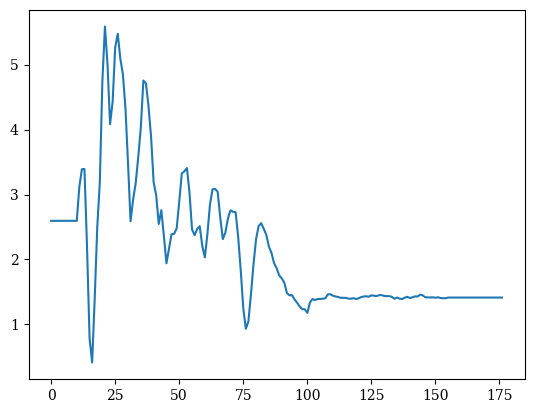

1.306532663316581


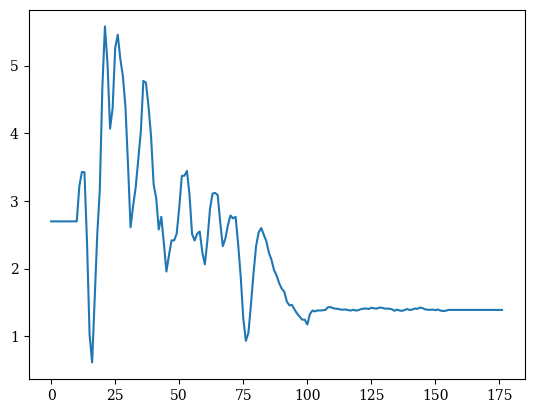

1.557788944723617


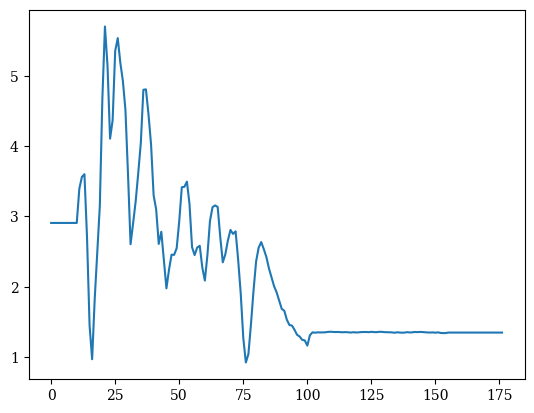

1.809045226130653


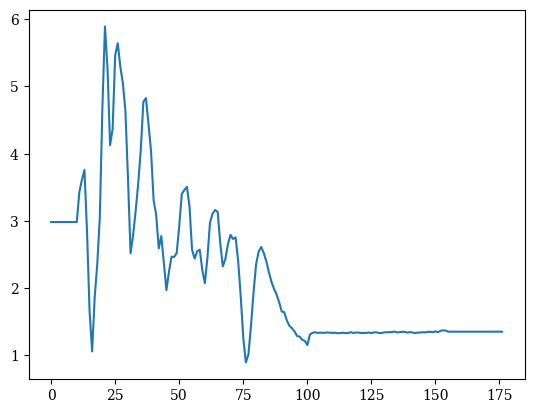

2.0603015075376874


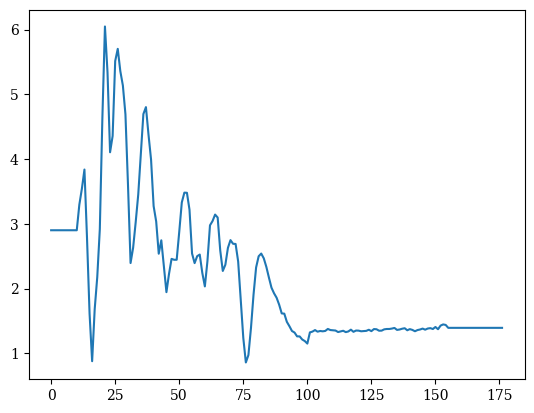

2.3115577889447216


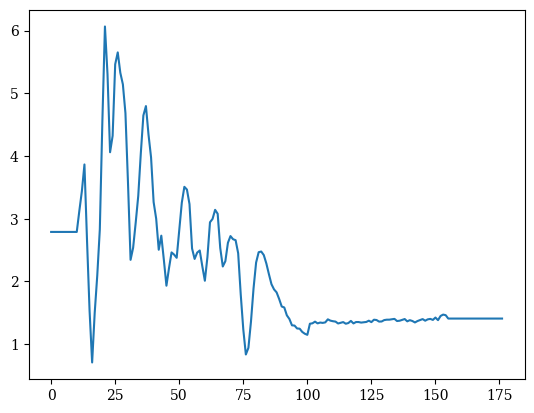

2.5628140703517577


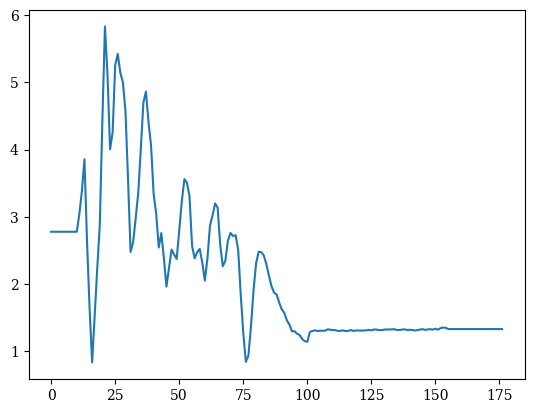

2.8140703517587937


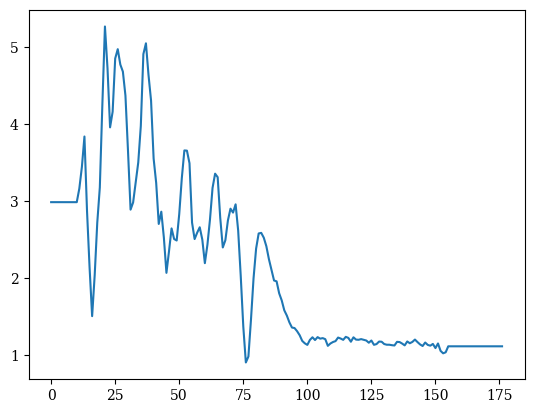

3.065326633165828


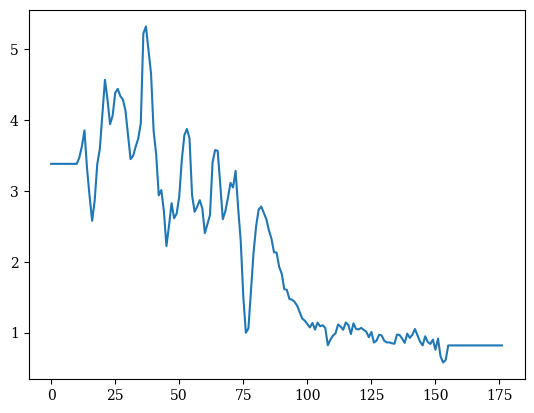

3.3165829145728623


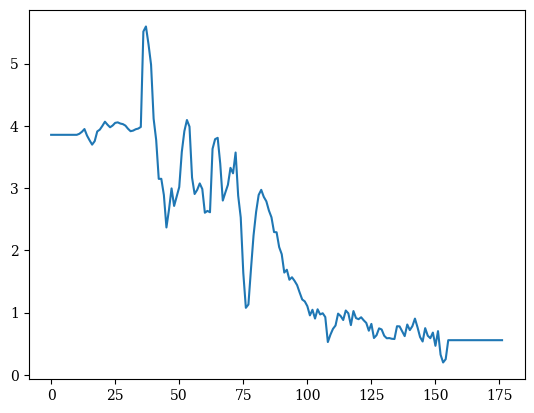

3.5678391959798983


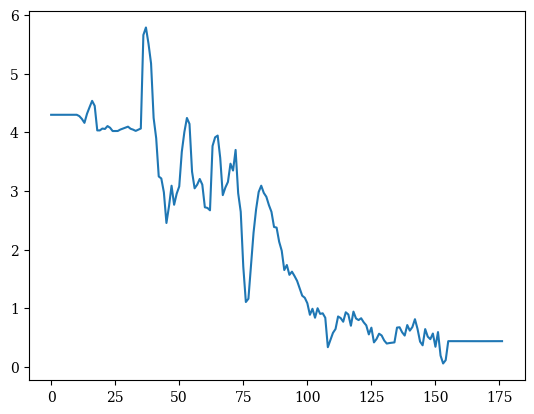

3.8190954773869343


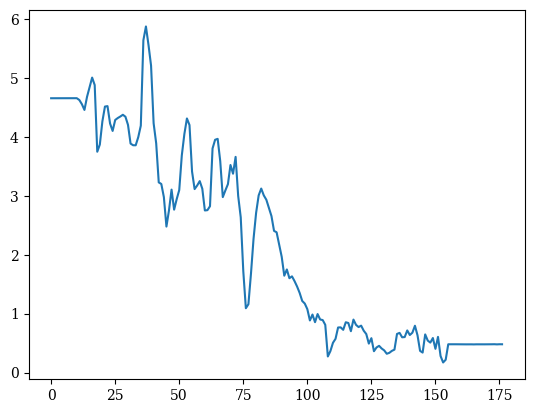

4.070351758793969


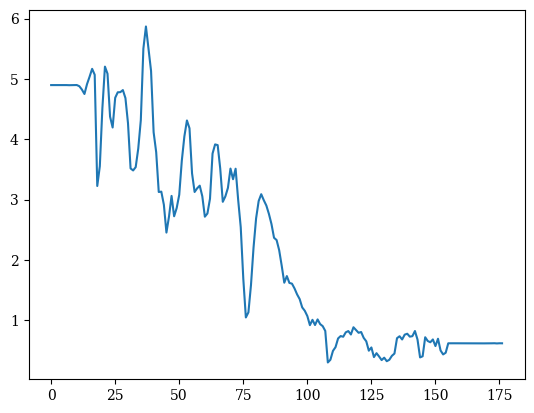

4.321608040201003


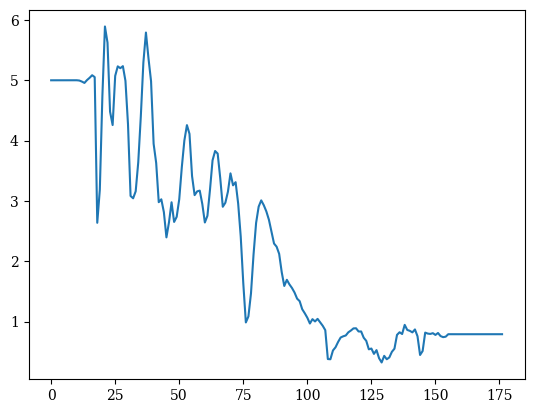

4.572864321608039


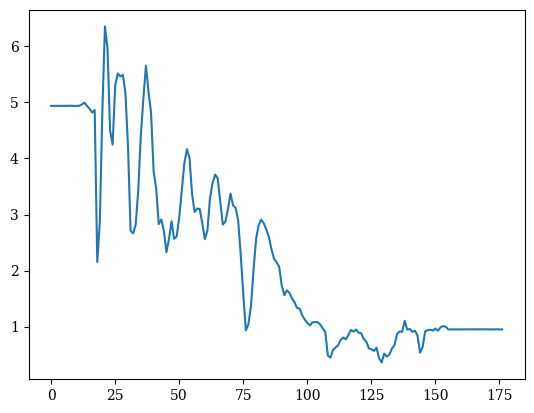

4.824120603015075


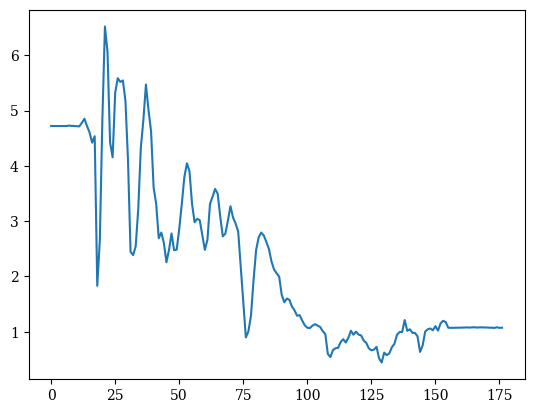

5.075376884422109


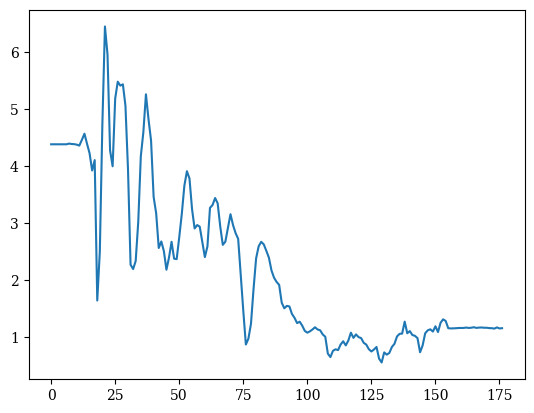

5.3266331658291435


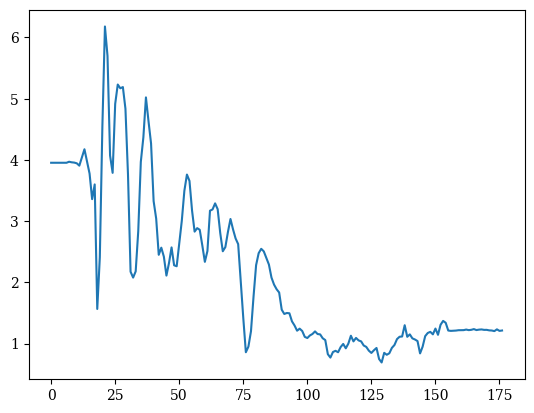

5.5778894472361795


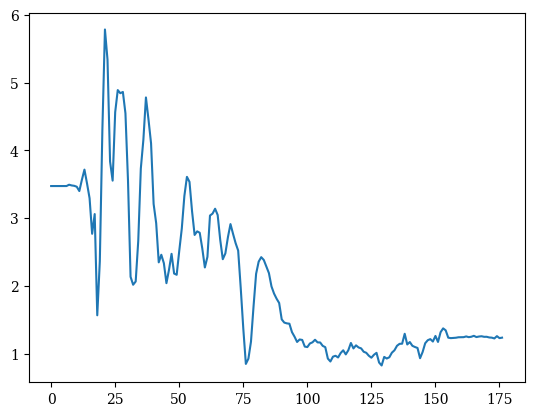

5.829145728643216


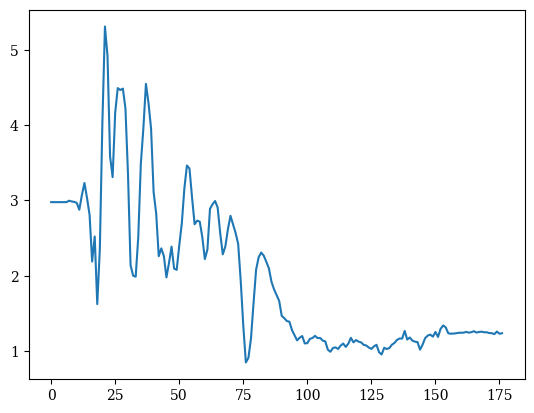

6.08040201005025


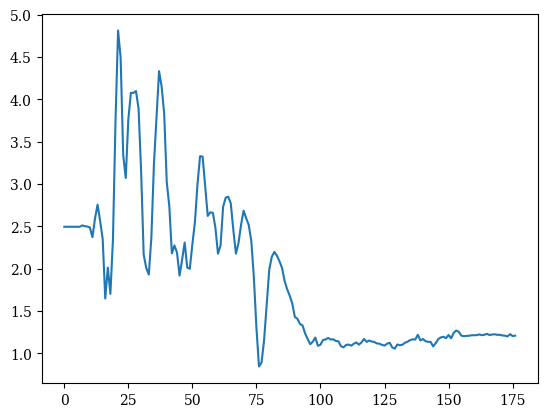

6.331658291457284


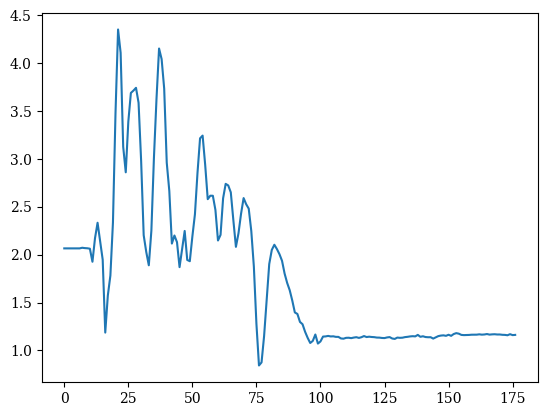

6.582914572864318


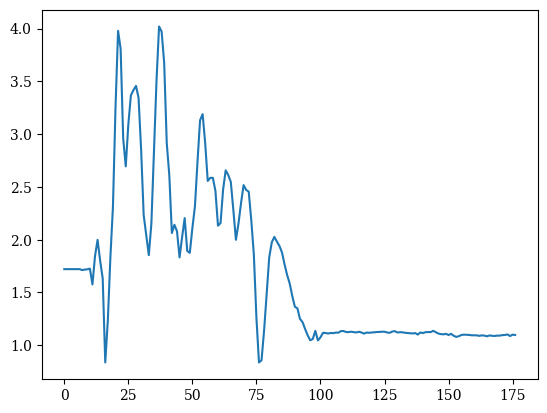

6.834170854271356


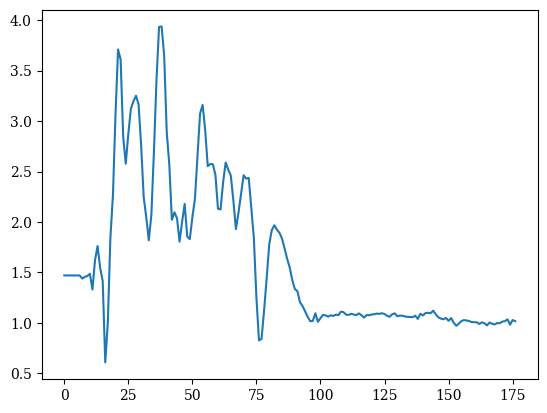

7.08542713567839


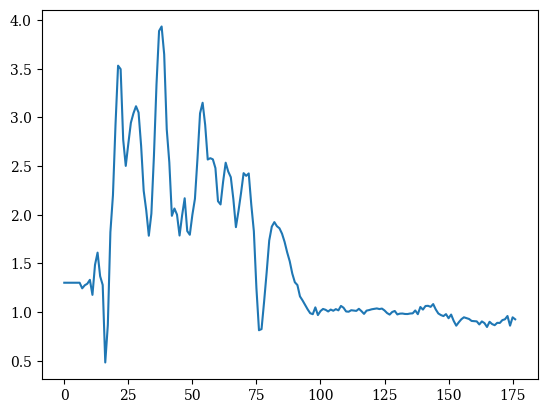

7.336683417085425


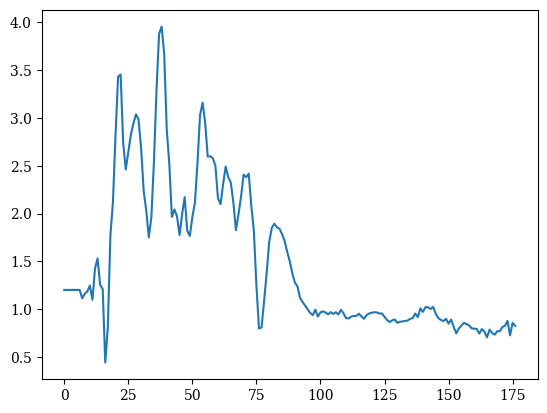

7.5879396984924625


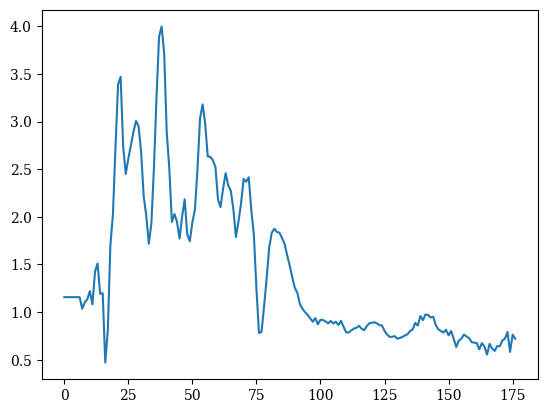

7.839195979899497


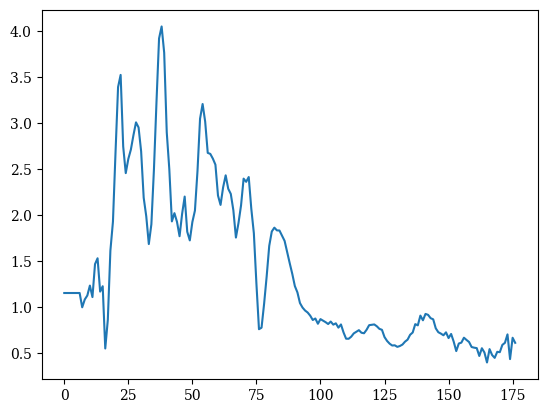

8.090452261306531


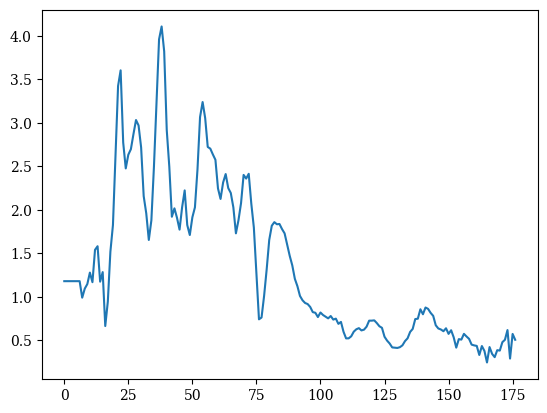

8.341708542713565


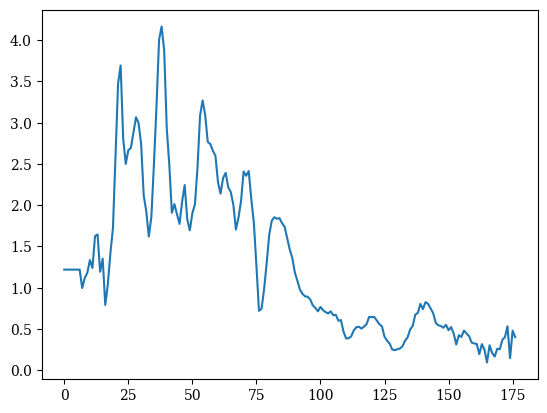

8.5929648241206


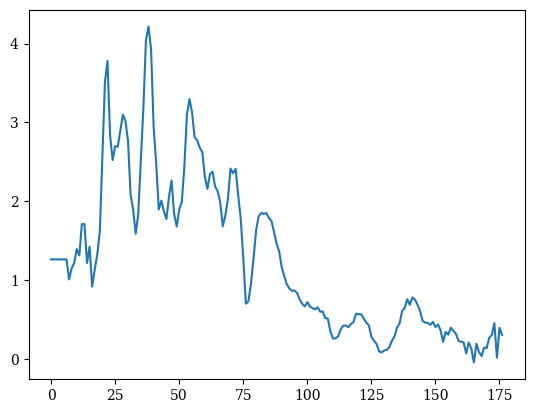

8.844221105527637


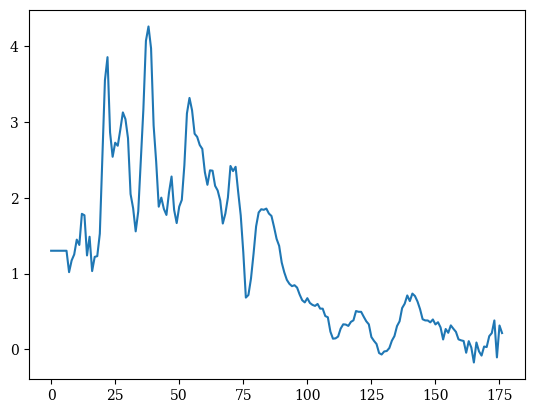

9.095477386934672


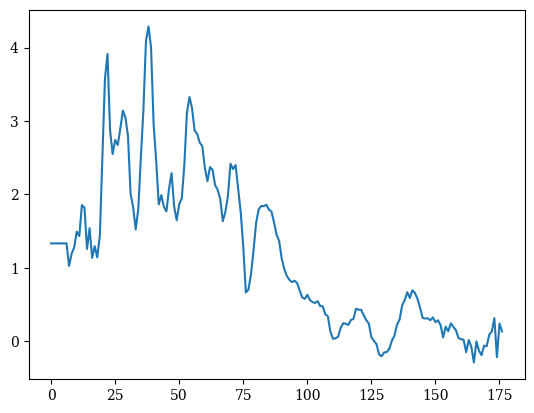

9.346733668341706


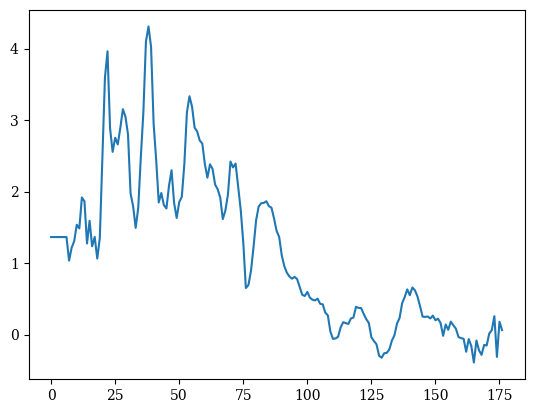

9.597989949748744


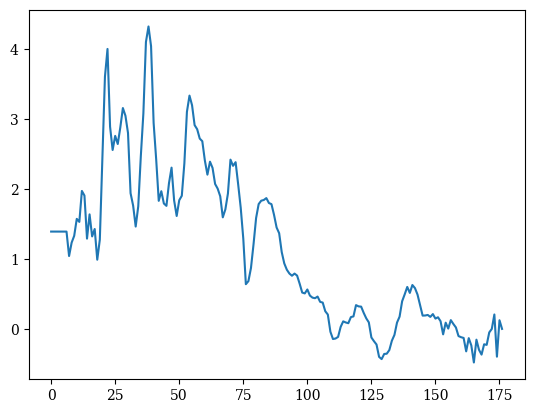

9.849246231155778


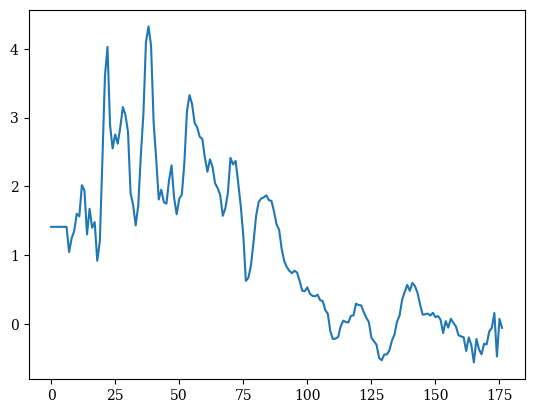

10.100502512562812


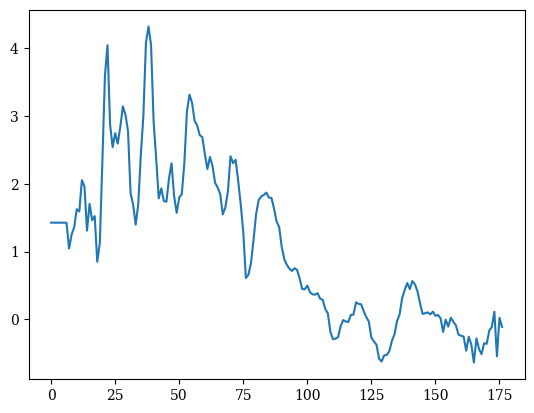

10.351758793969847


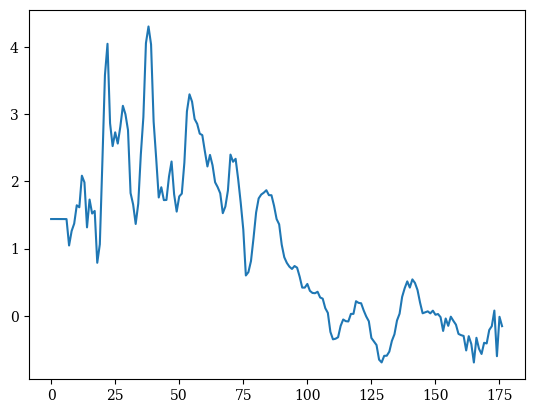

10.60301507537688


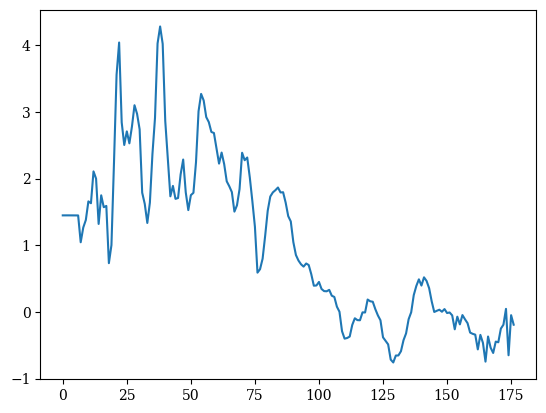

10.854271356783919


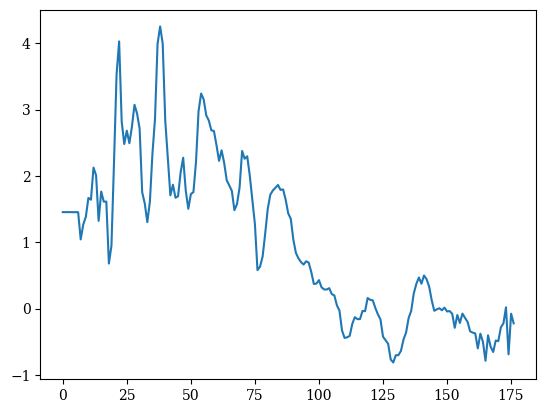

11.105527638190953


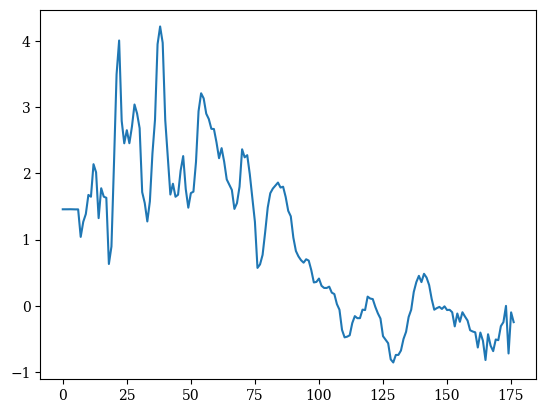

11.356783919597987


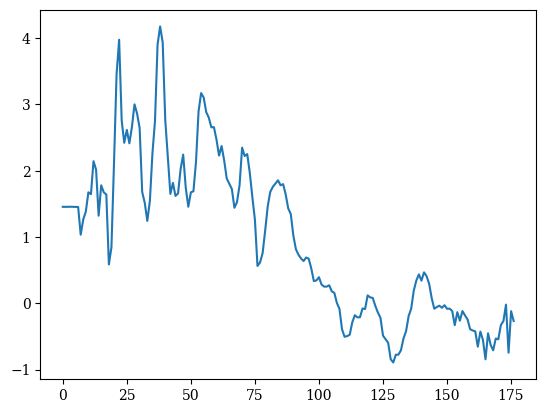

11.608040201005025


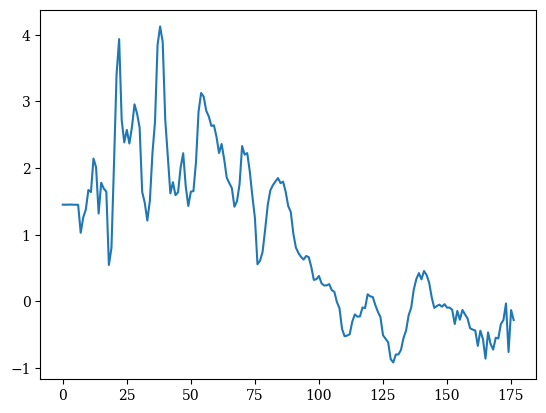

11.85929648241206


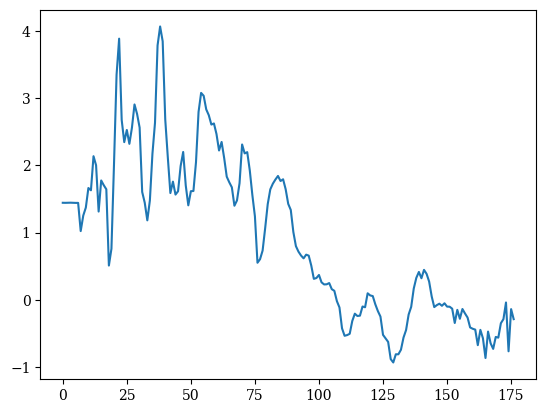

12.110552763819094


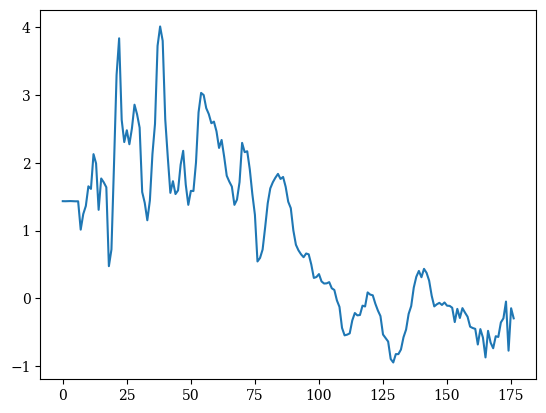

12.361809045226128


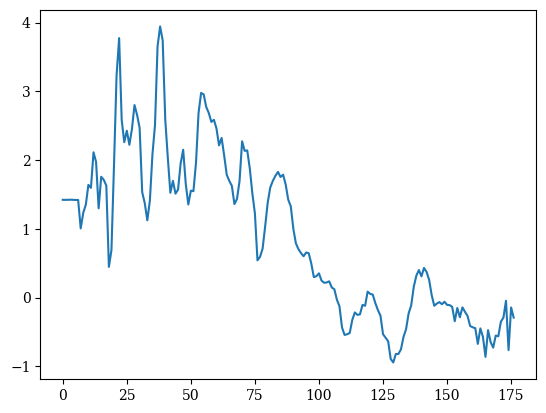

12.613065326633162


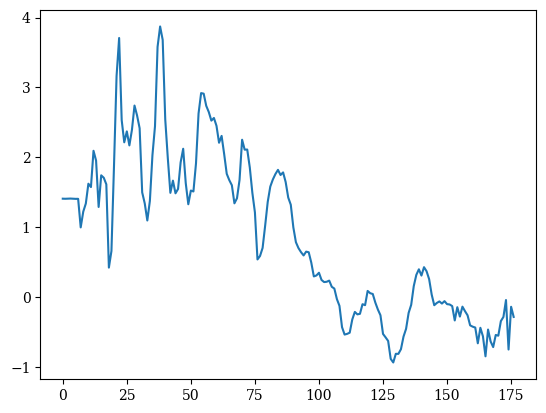

12.8643216080402


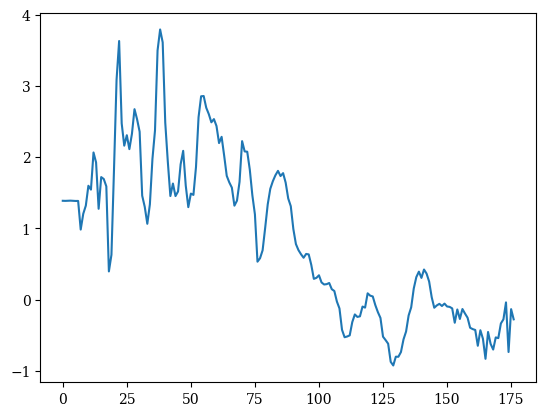

13.115577889447234


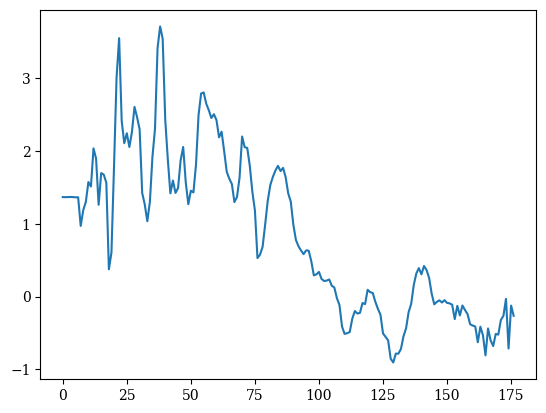

13.366834170854268


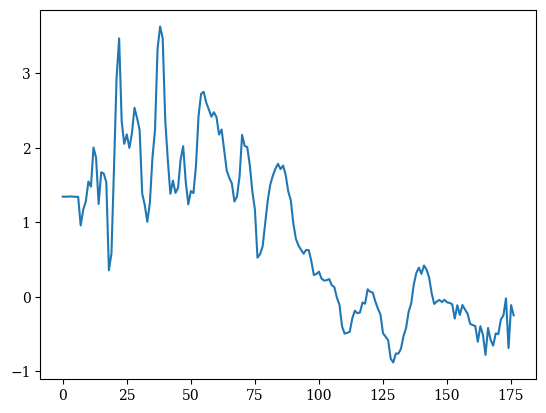

13.618090452261306


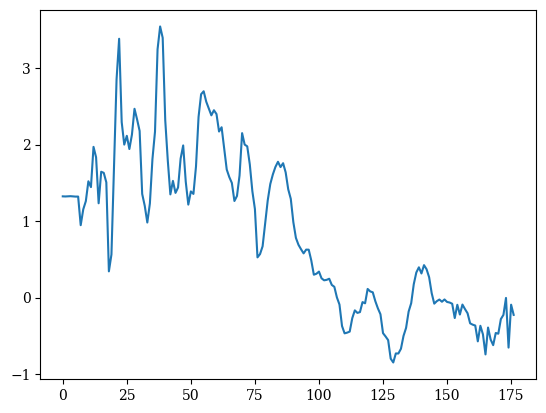

13.86934673366834


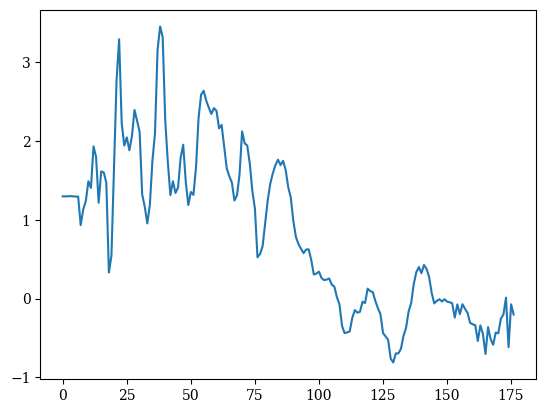

14.120603015075375


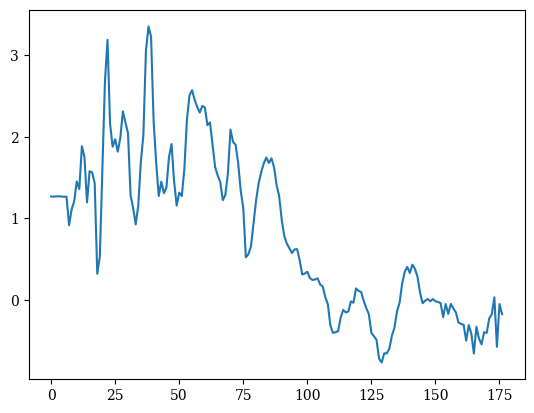

14.371859296482409


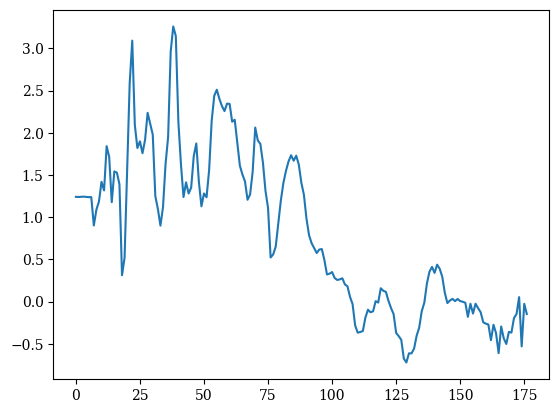

14.623115577889443


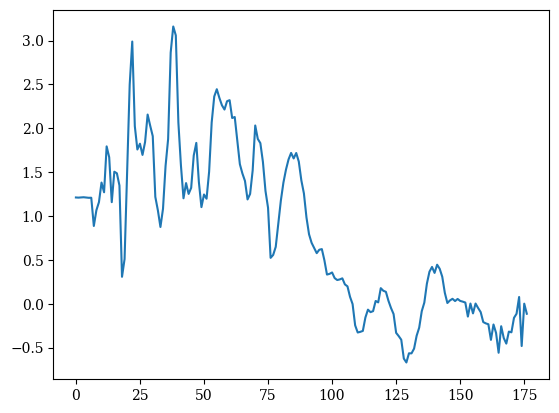

14.874371859296481


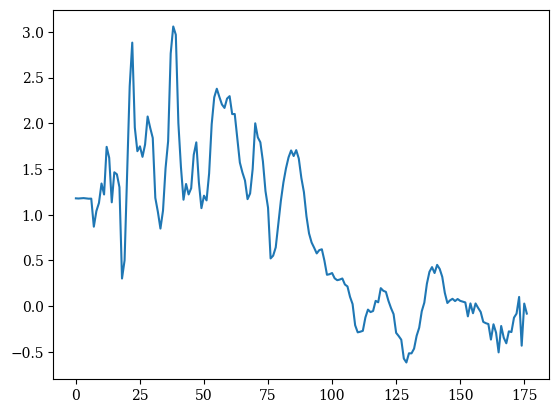

15.125628140703515


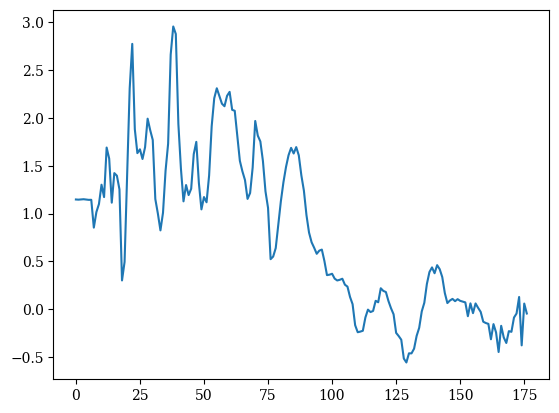

15.37688442211055


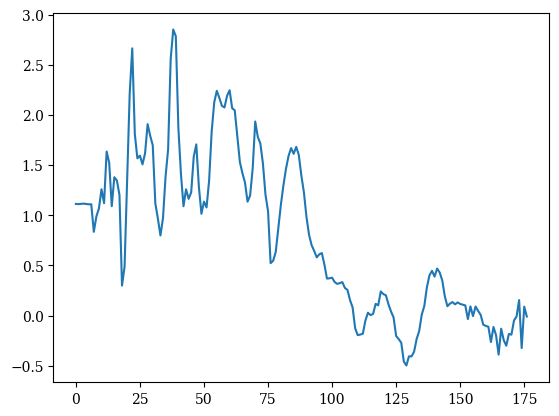

15.628140703517587


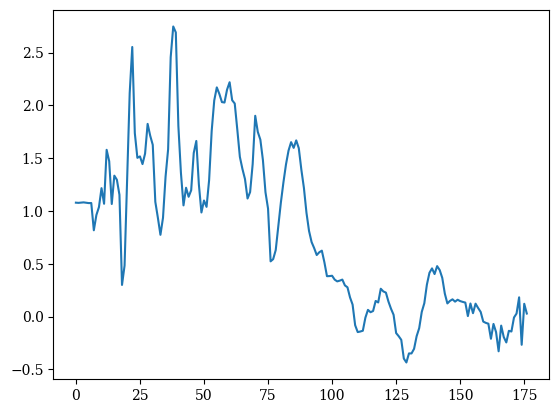

15.879396984924622


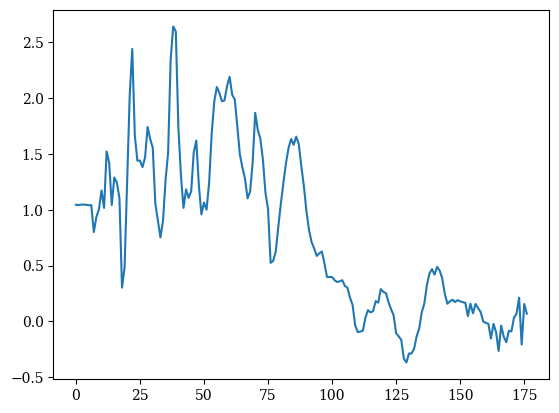

16.130653266331656


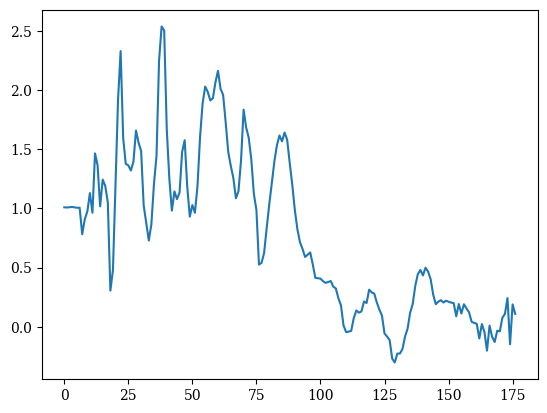

16.38190954773869


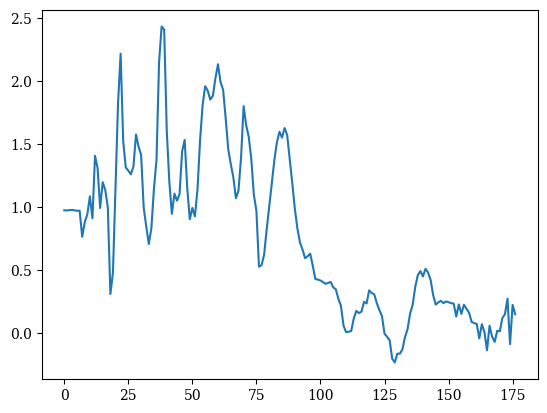

16.633165829145725


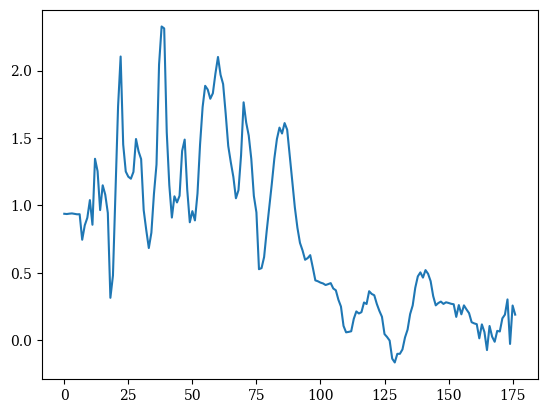

16.884422110552762


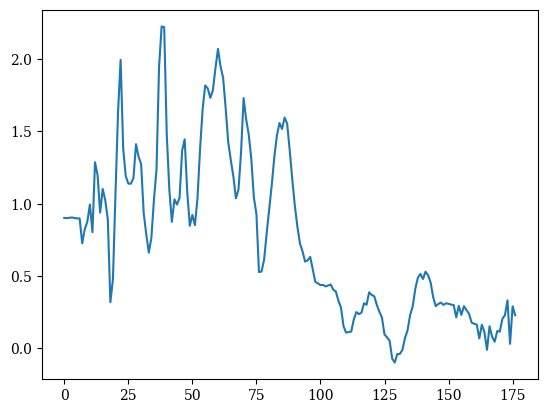

17.135678391959797


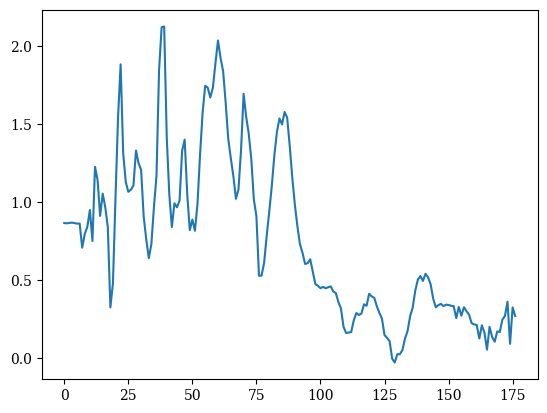

17.38693467336683


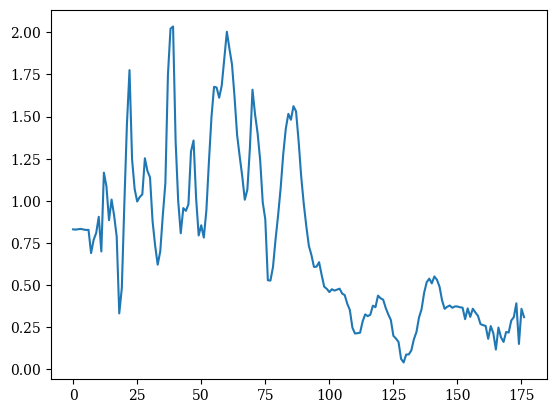

17.63819095477387


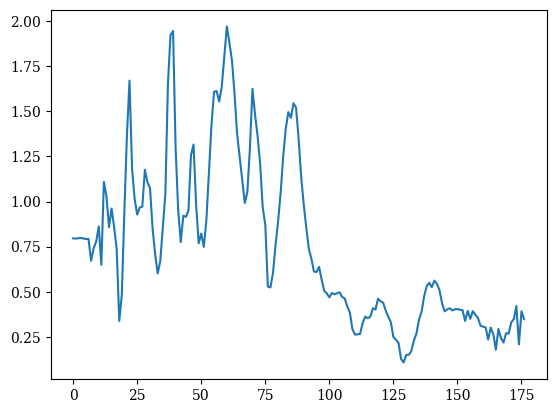

17.889447236180903


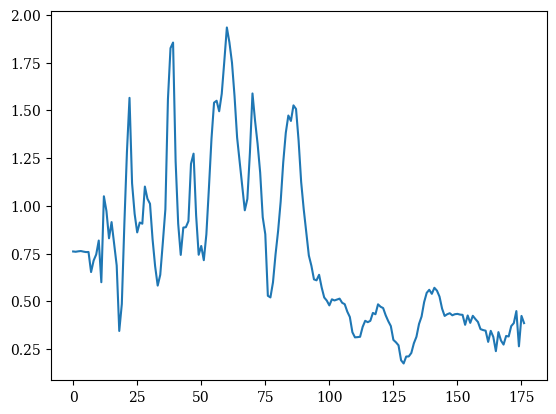

18.140703517587937


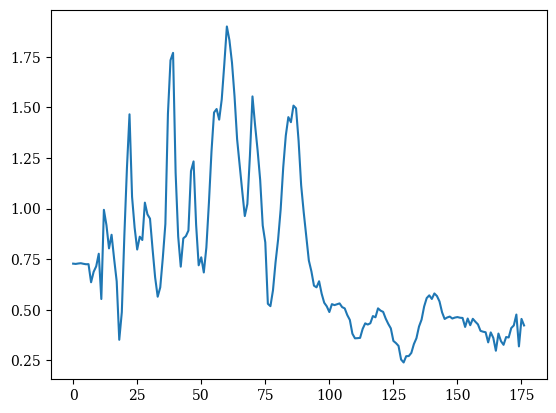

18.39195979899497


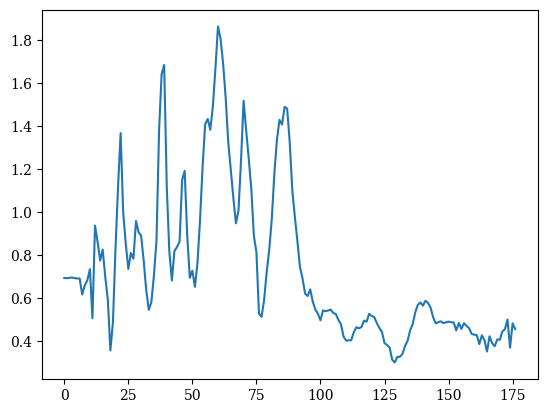

18.643216080402006


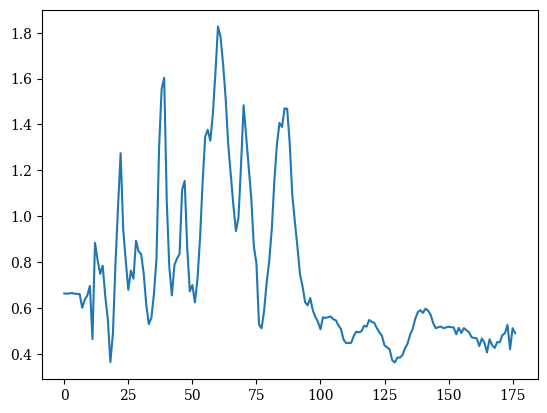

18.894472361809044


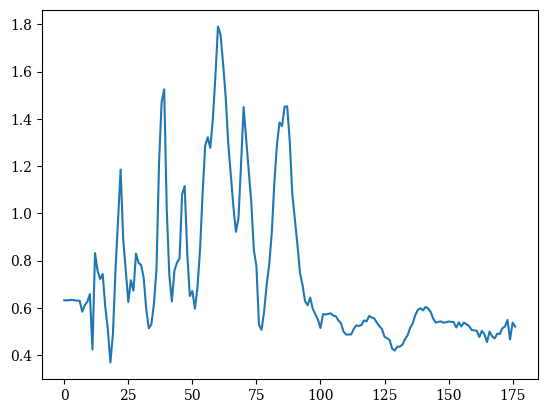

19.145728643216078


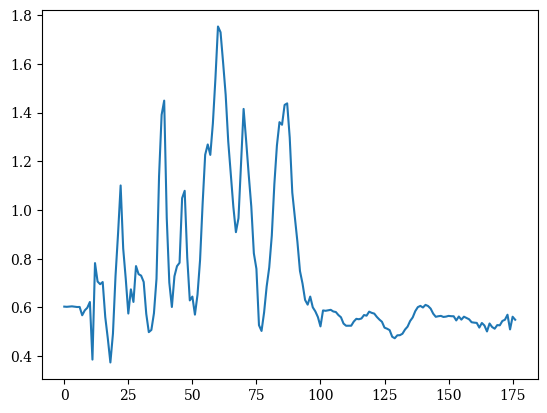

19.396984924623112


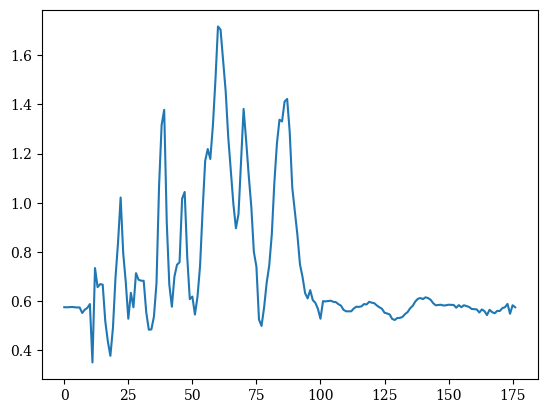

19.64824120603015


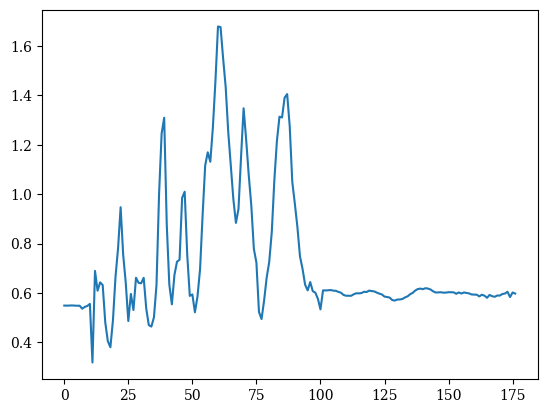

19.899497487437184


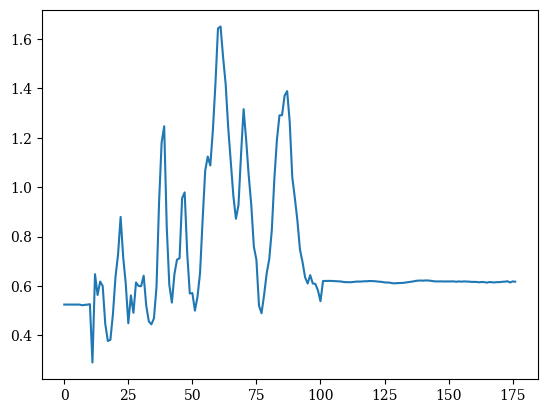

20.15075376884422


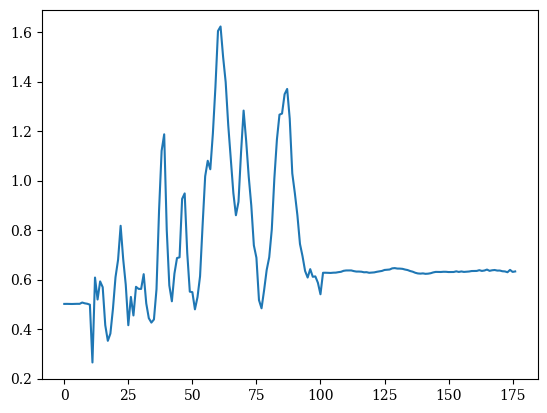

20.402010050251253


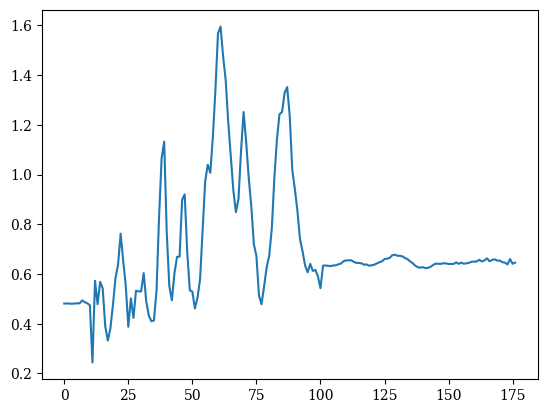

20.653266331658287


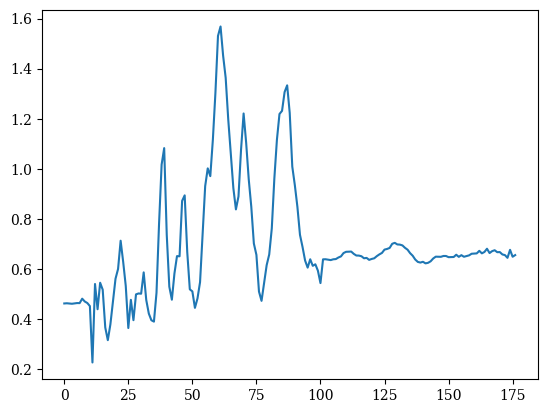

20.904522613065325


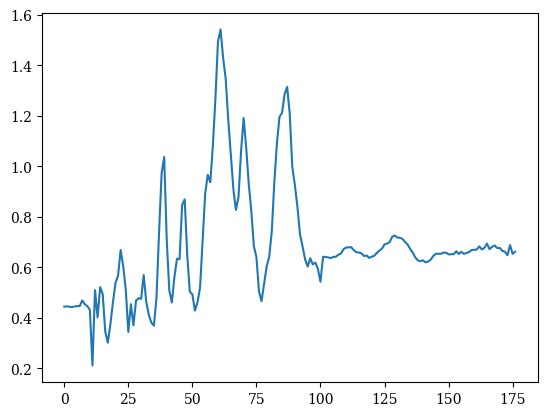

21.15577889447236


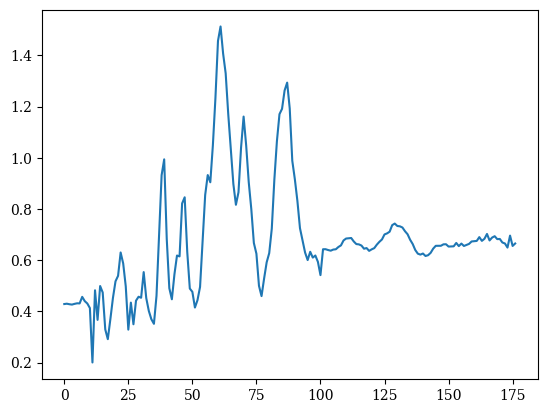

21.407035175879393


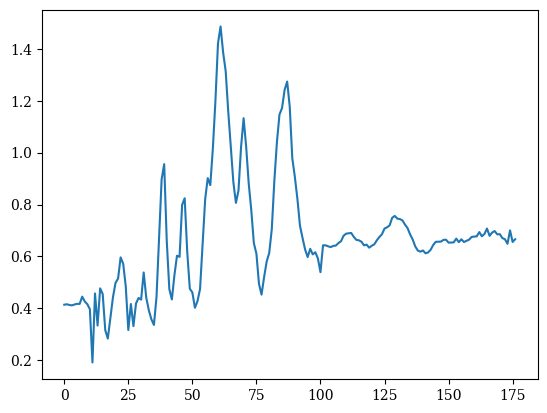

21.65829145728643


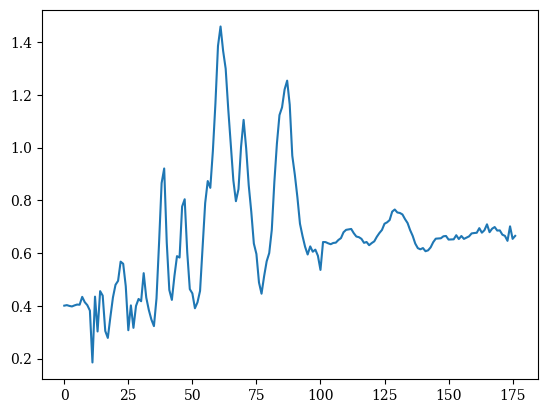

21.909547738693465


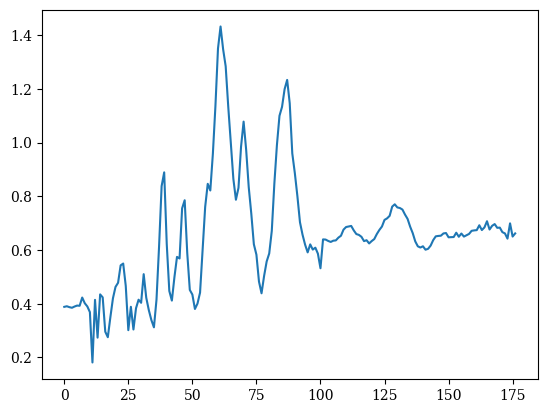

22.1608040201005


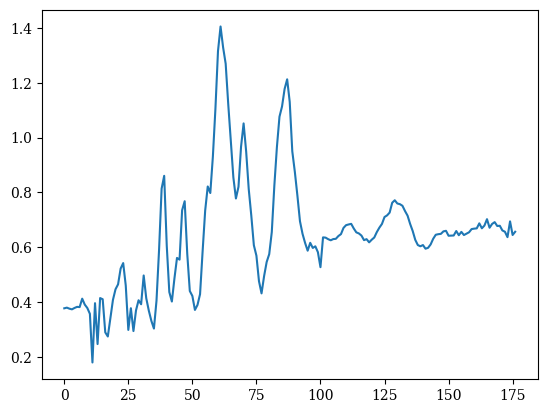

22.412060301507537


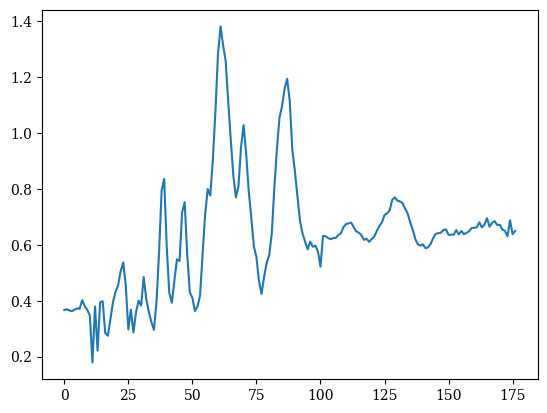

22.663316582914568


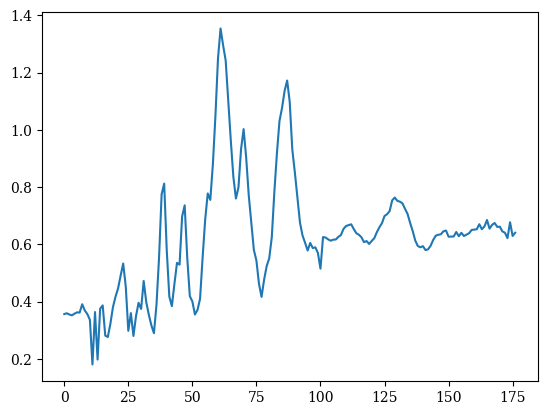

22.914572864321606


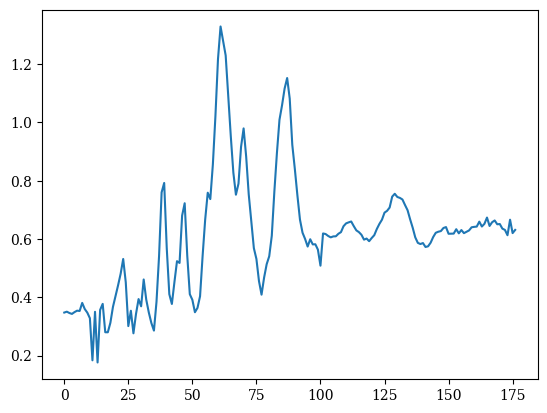

23.165829145728637


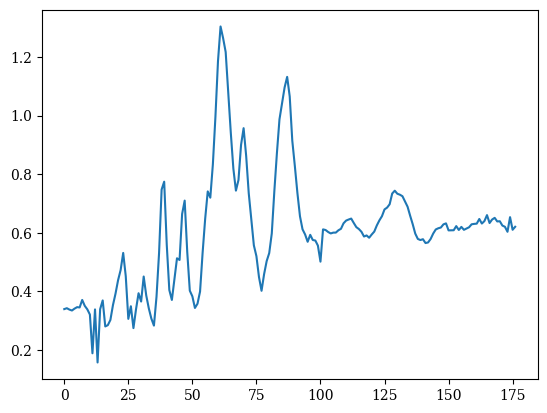

23.417085427135675


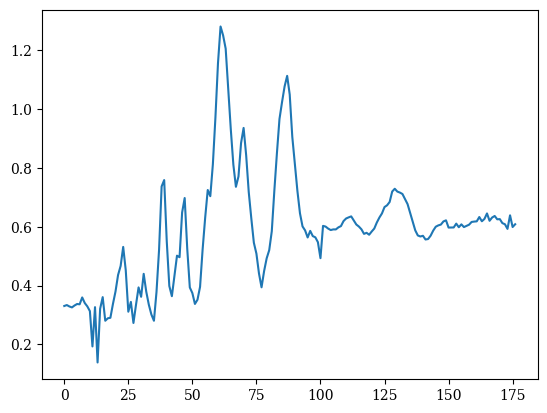

23.668341708542712


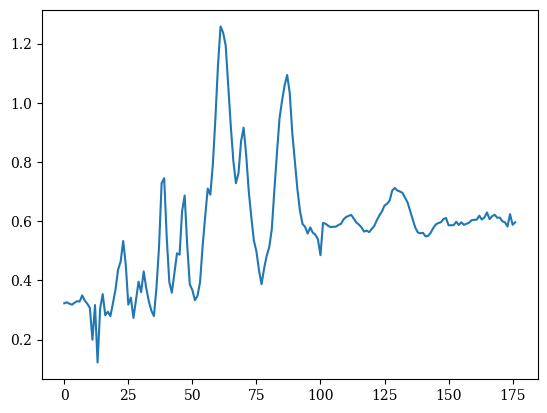

23.919597989949743


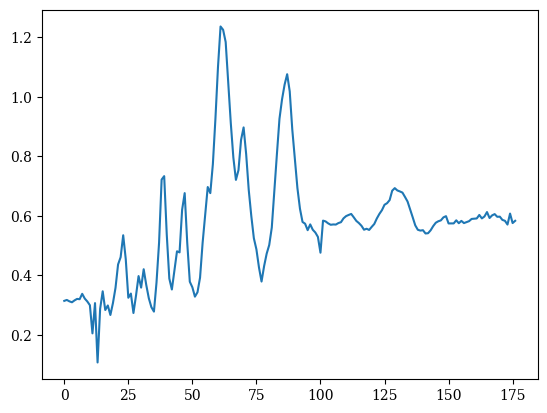

24.17085427135678


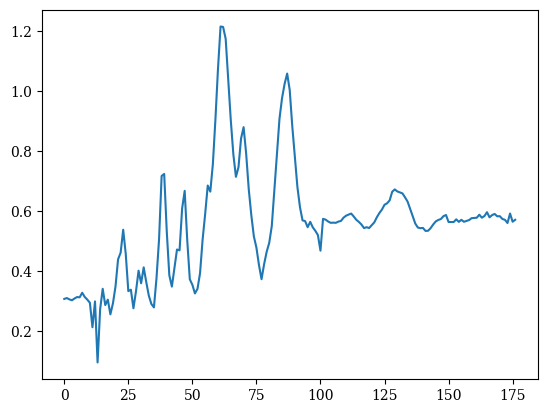

24.42211055276382


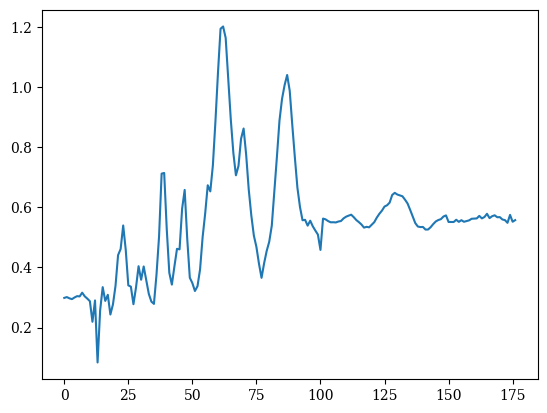

24.67336683417085


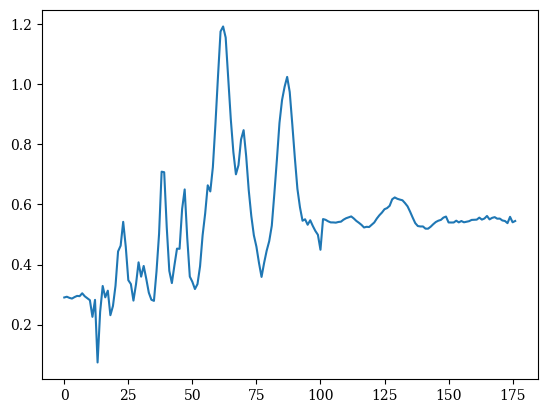

24.924623115577887


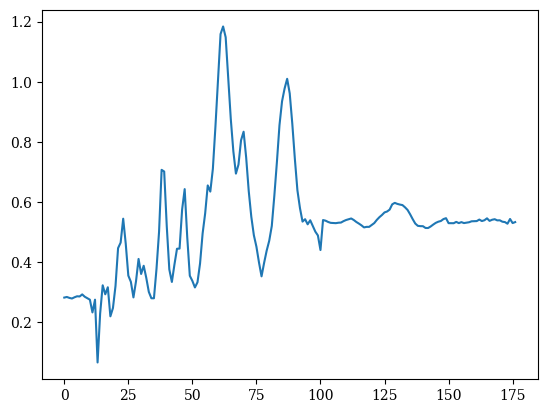

25.175879396984925


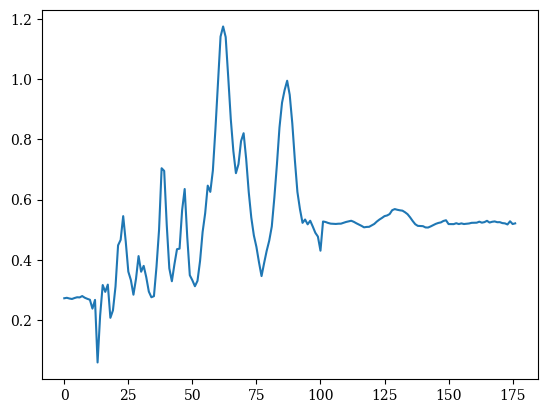

25.427135678391956


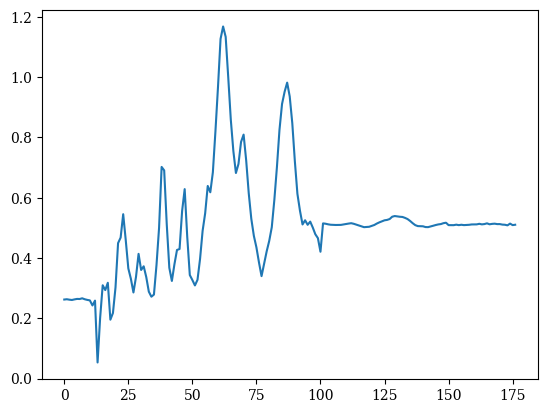

25.678391959798994


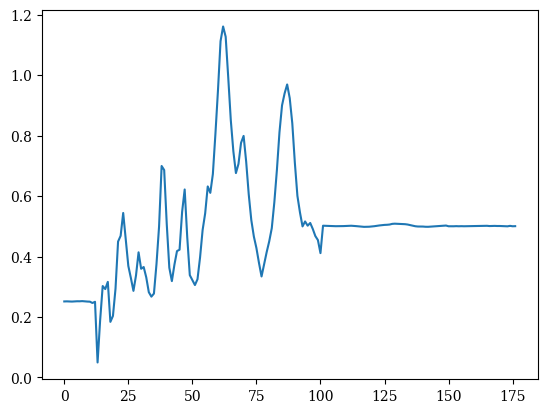

25.929648241206024


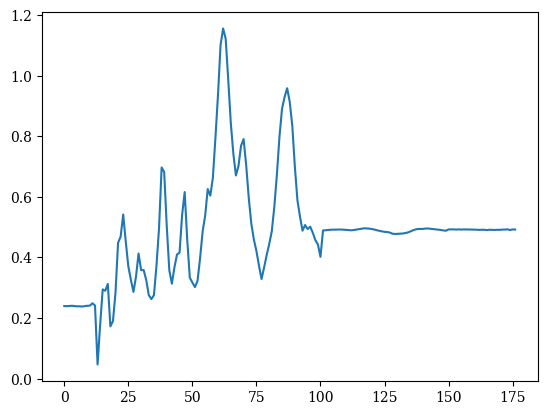

26.180904522613062


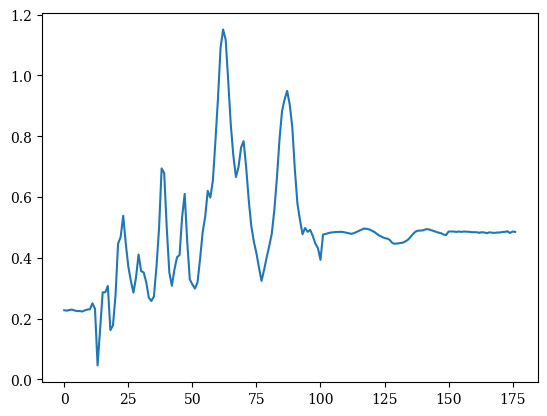

26.4321608040201


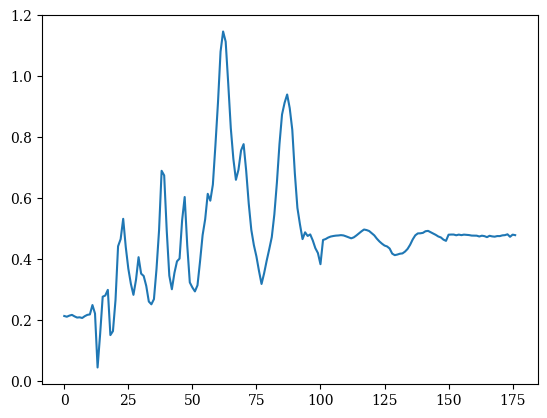

26.68341708542713


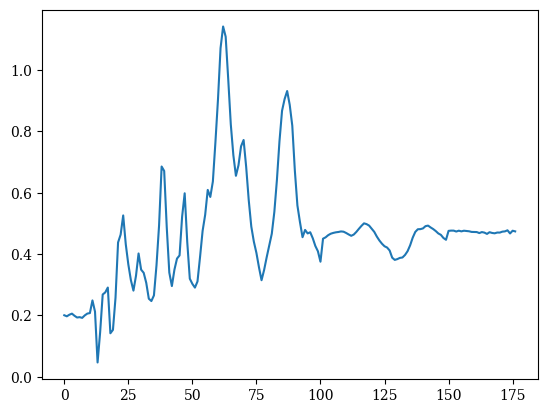

26.93467336683417


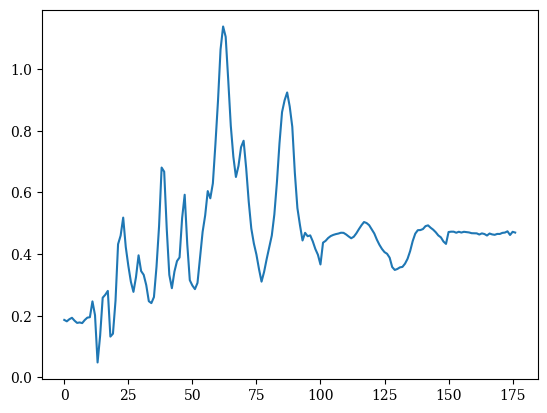

27.1859296482412


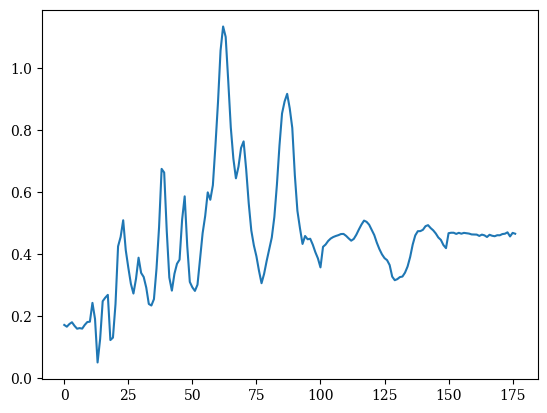

27.437185929648237


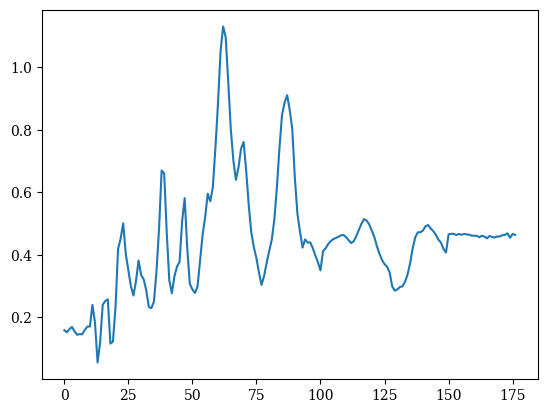

27.688442211055275


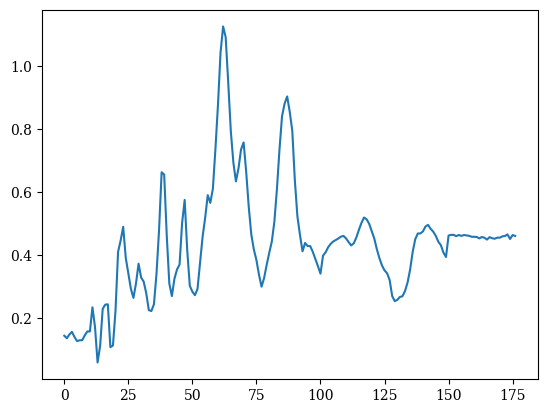

27.939698492462306


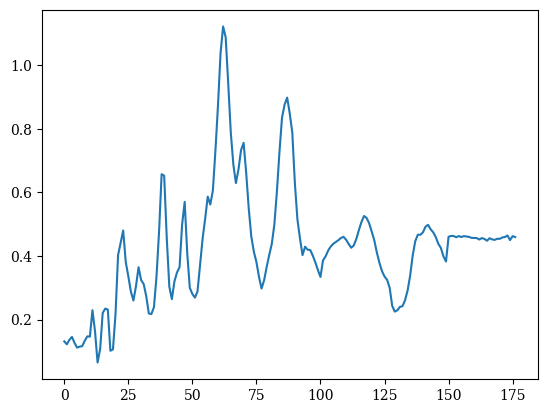

28.190954773869343


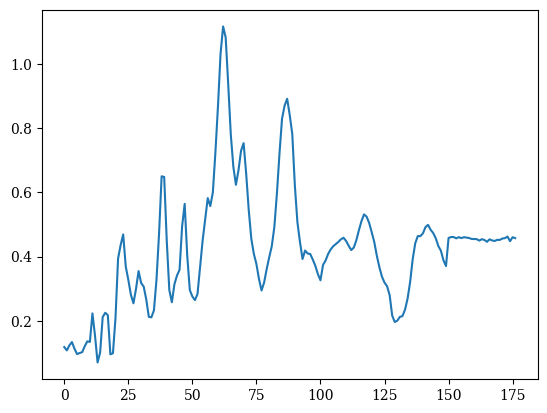

28.44221105527638


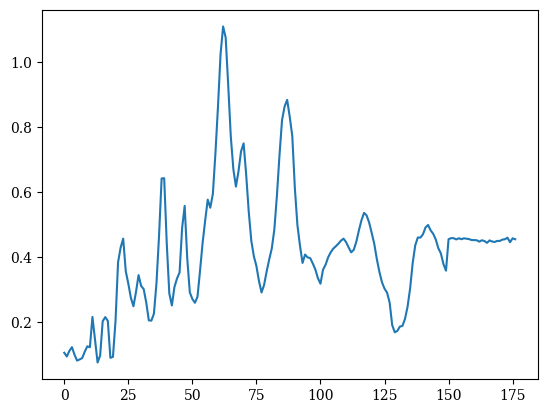

28.693467336683412


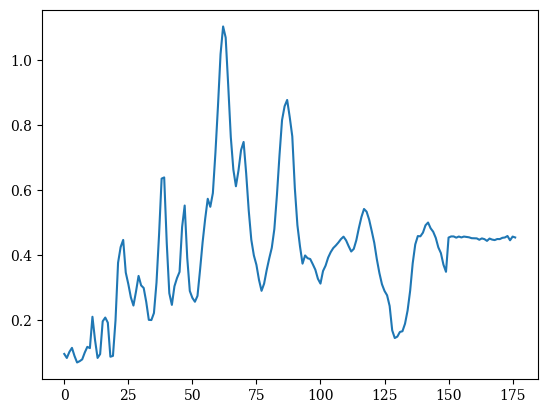

28.94472361809045


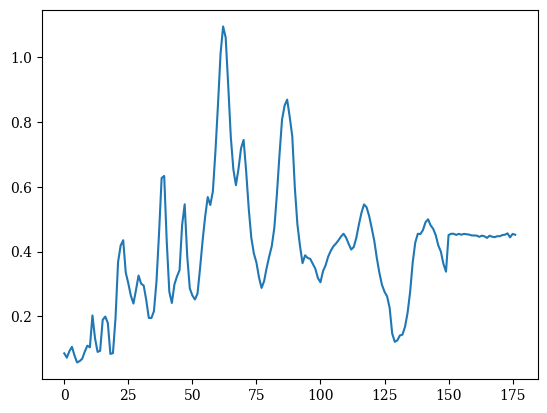

29.195979899497488


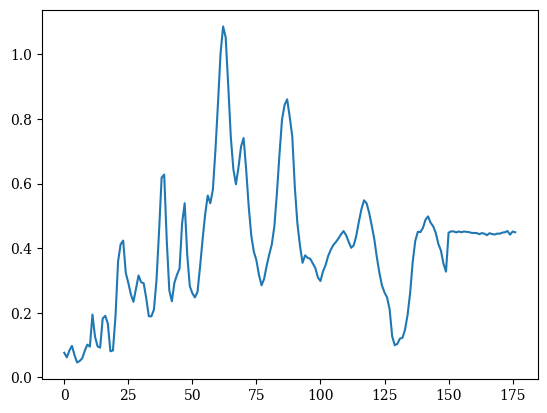

29.447236180904518


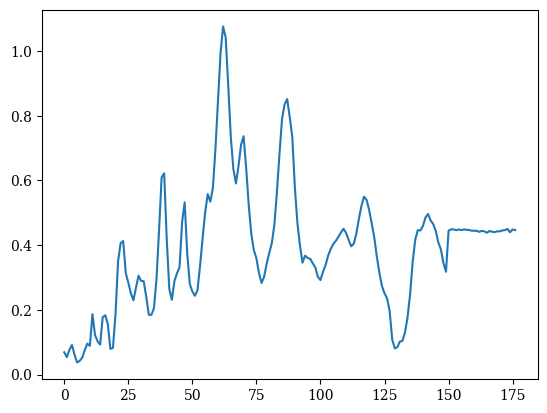

29.698492462311556


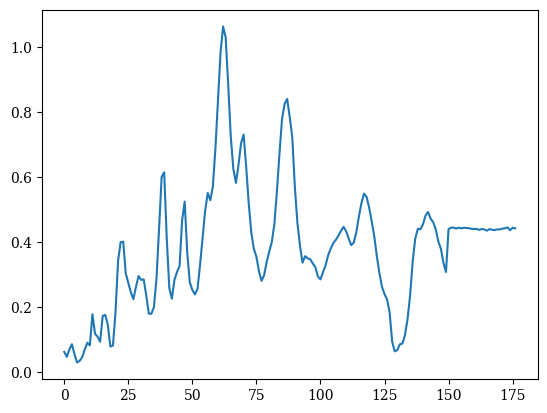

29.949748743718587


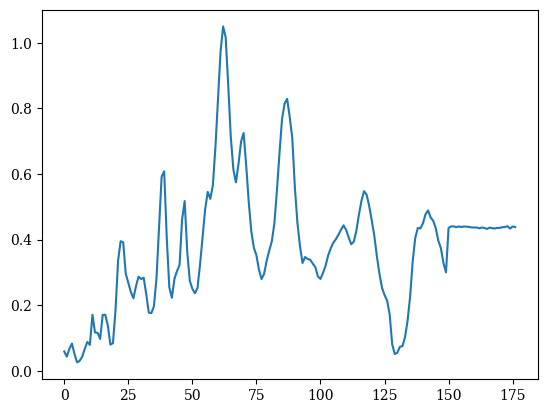

30.201005025125625


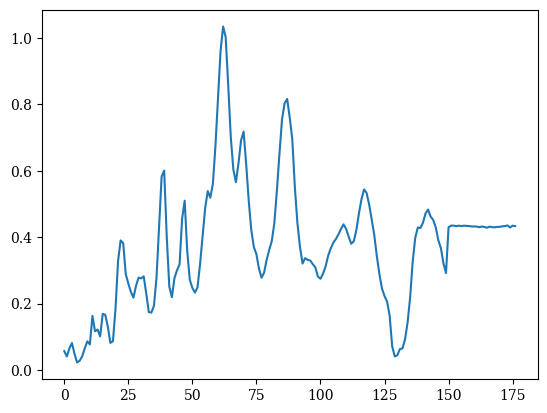

30.452261306532662


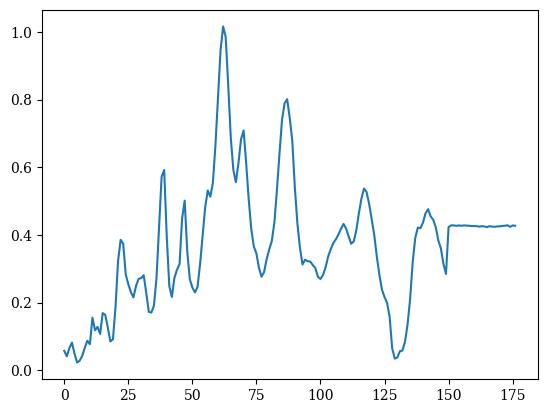

30.703517587939693


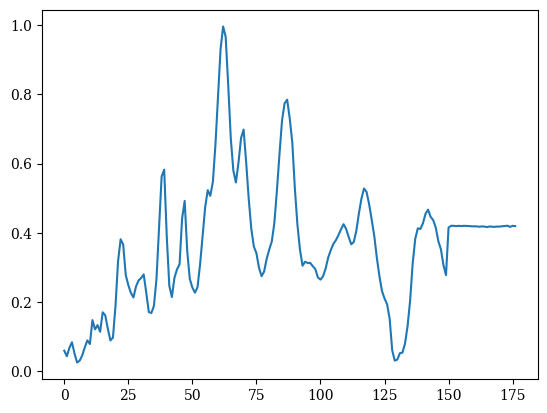

30.95477386934673


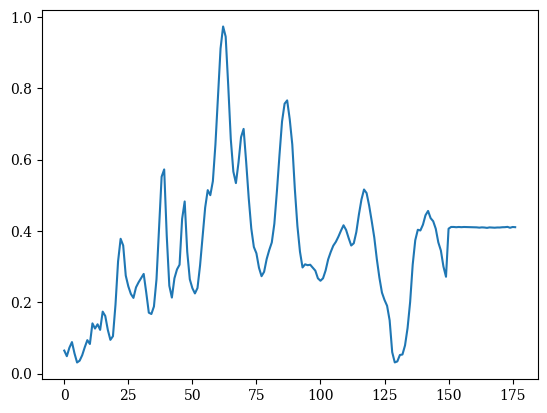

31.20603015075376


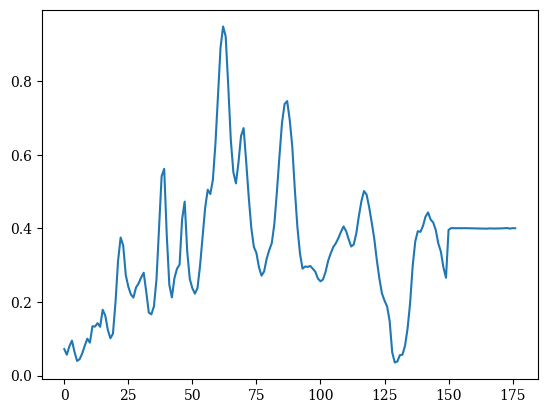

31.4572864321608


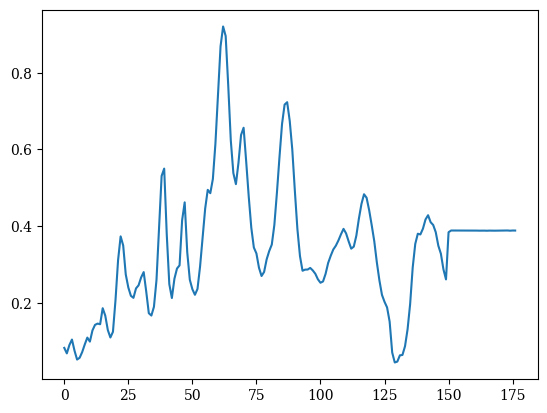

31.708542713567837


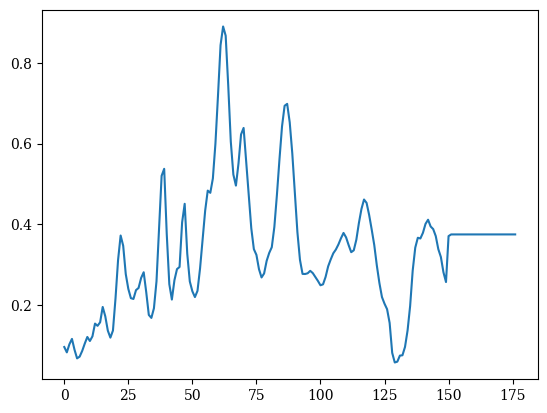

31.959798994974868


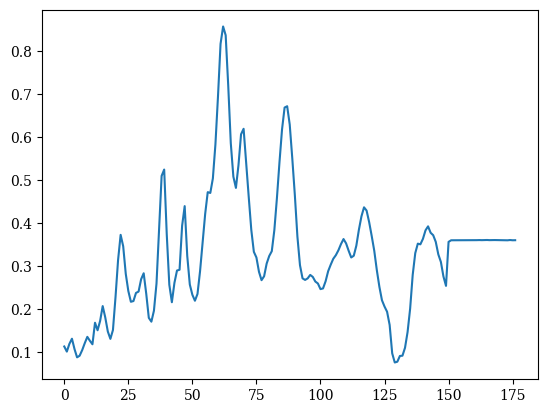

32.211055276381906


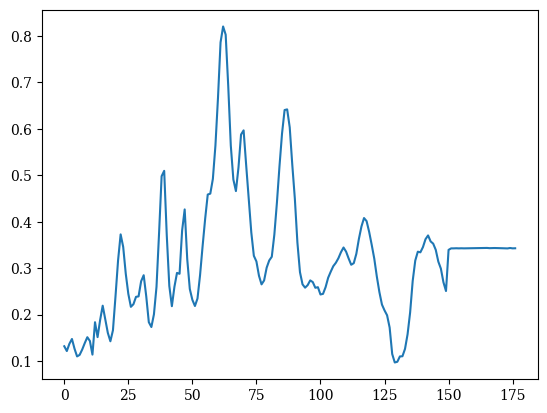

32.462311557788944


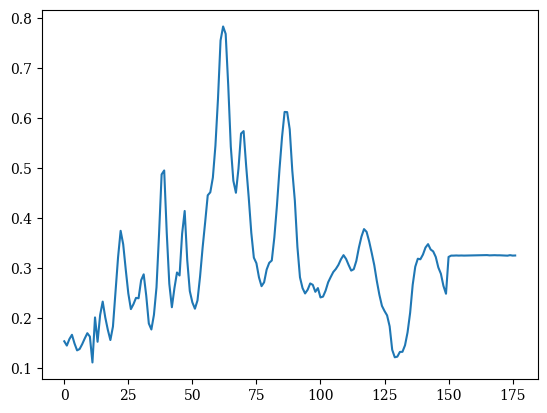

32.713567839195974


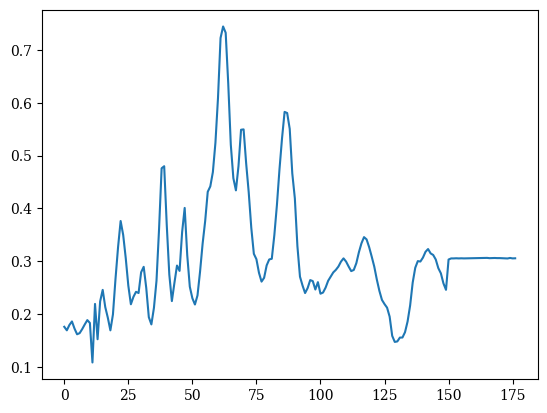

32.96482412060301


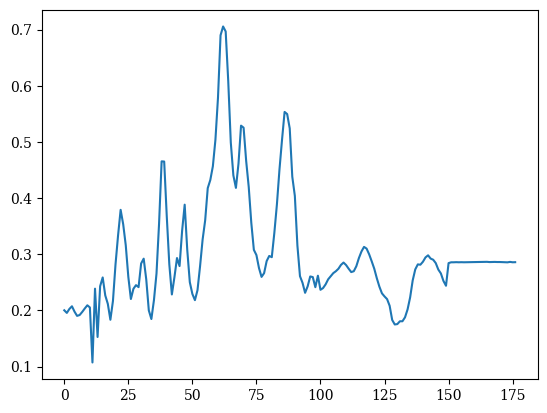

33.21608040201005


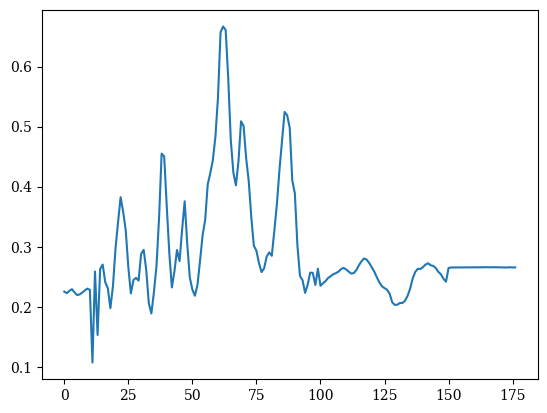

33.46733668341708


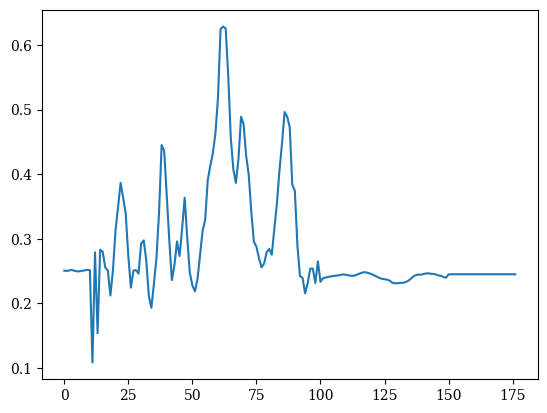

33.71859296482412


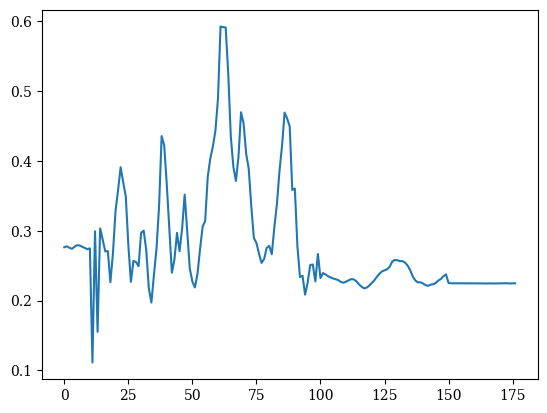

33.96984924623115


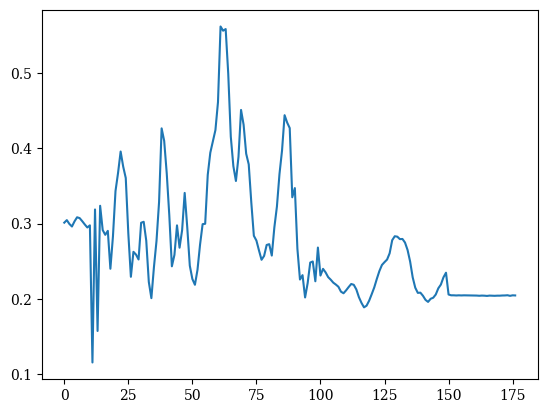

34.22110552763819


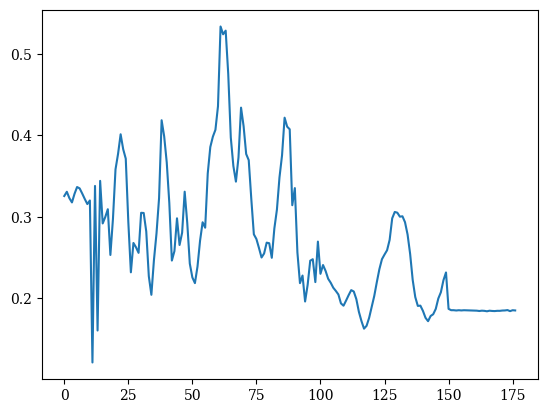

34.472361809045225


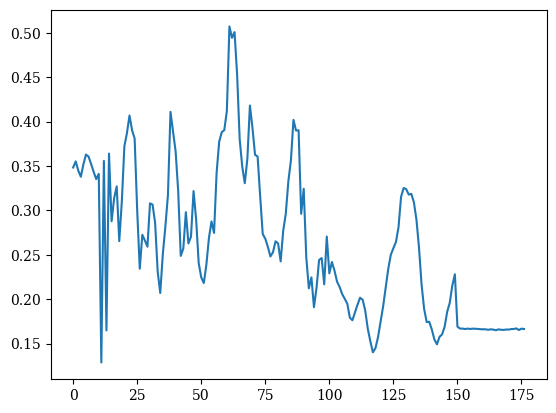

34.723618090452256


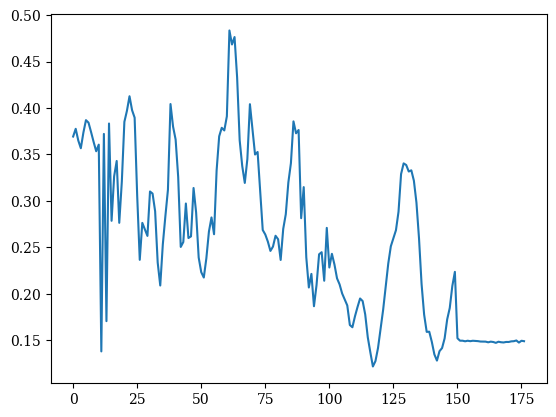

34.97487437185929


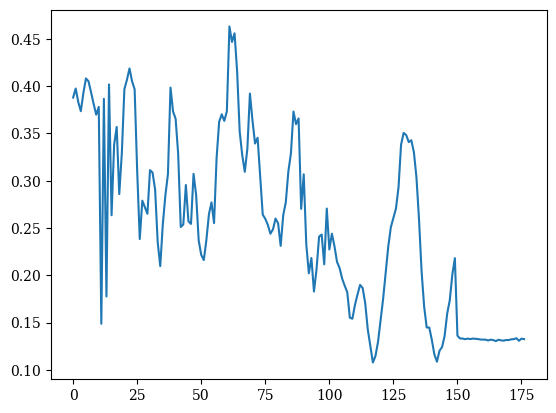

35.226130653266324


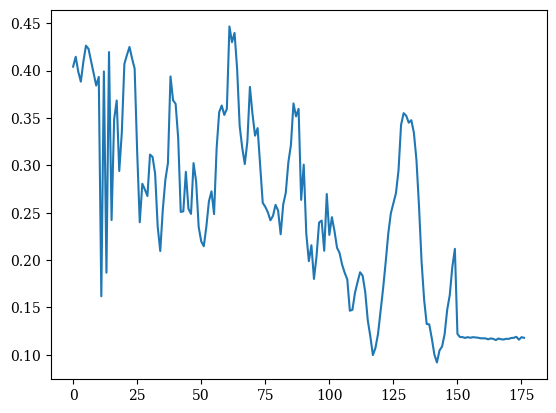

35.47738693467336


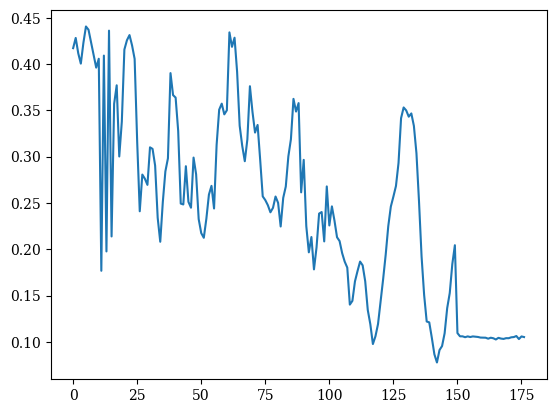

35.7286432160804


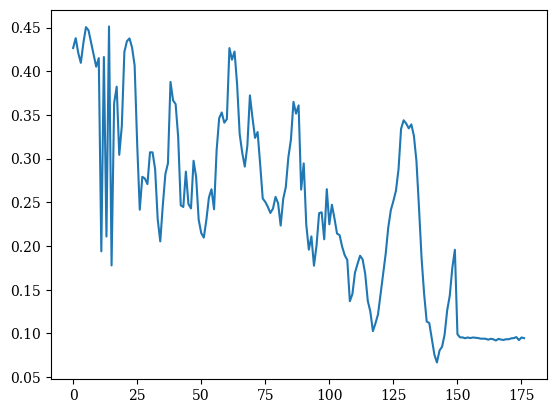

35.97989949748743


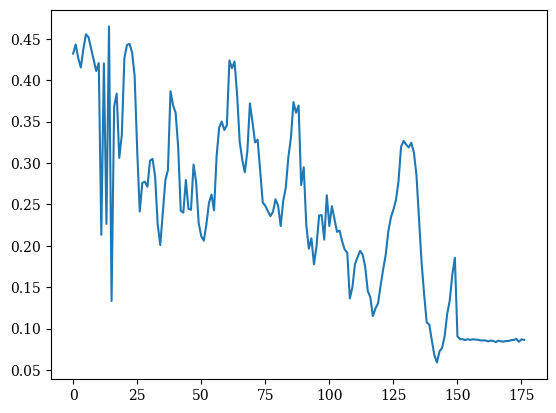

36.23115577889447


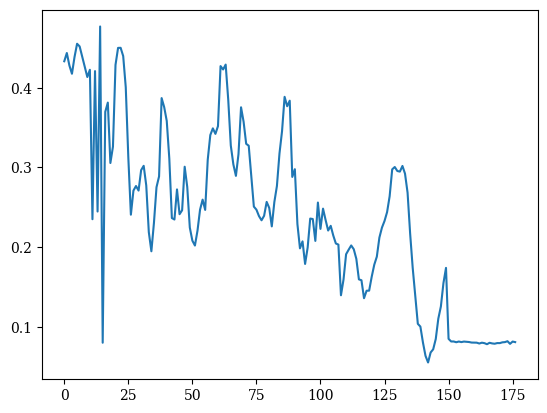

36.482412060301506


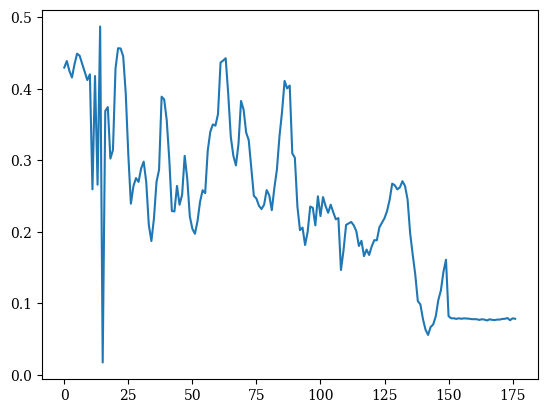

36.73366834170854


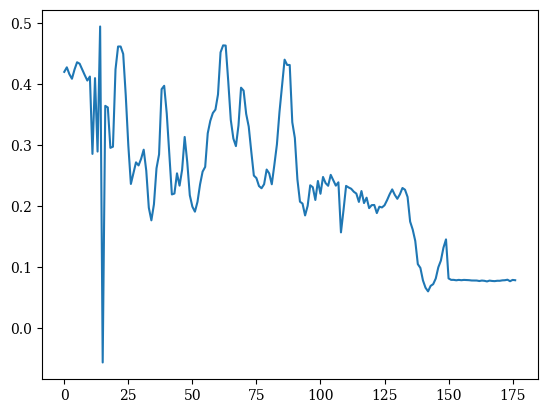

36.984924623115575


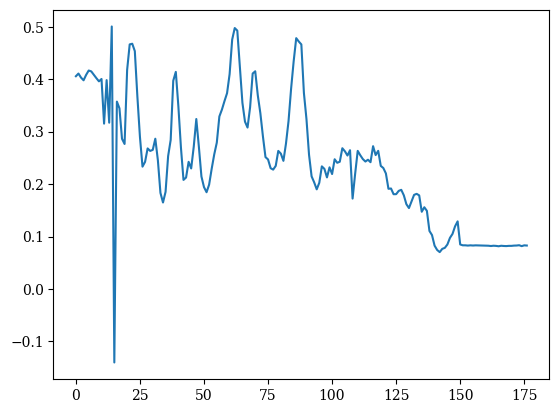

37.23618090452261


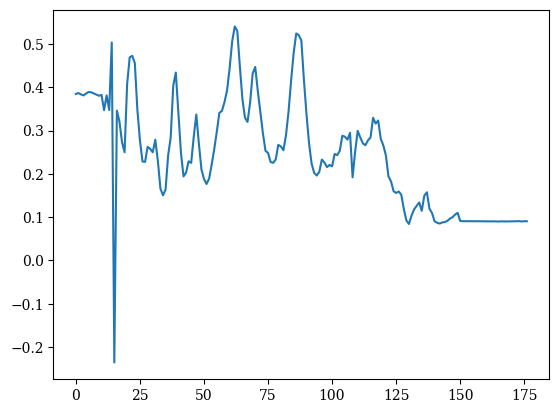

37.48743718592964


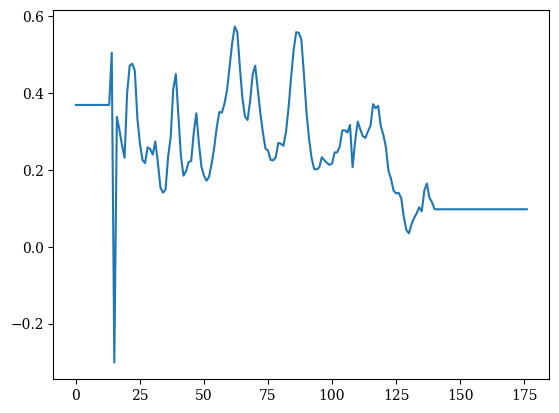

37.73869346733668


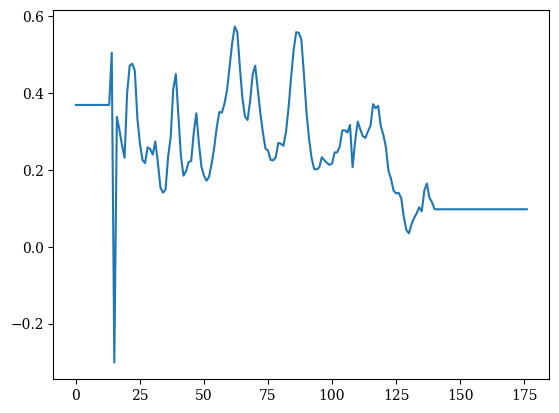

37.98994974874371


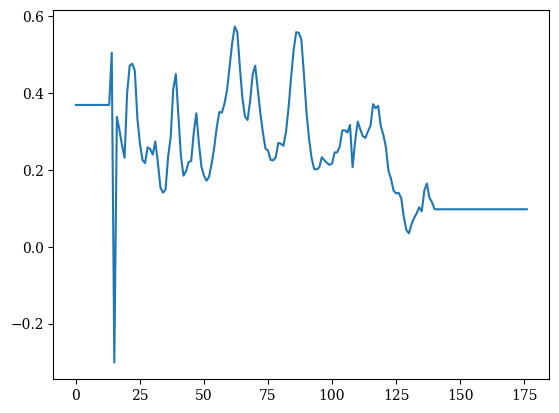

38.24120603015075


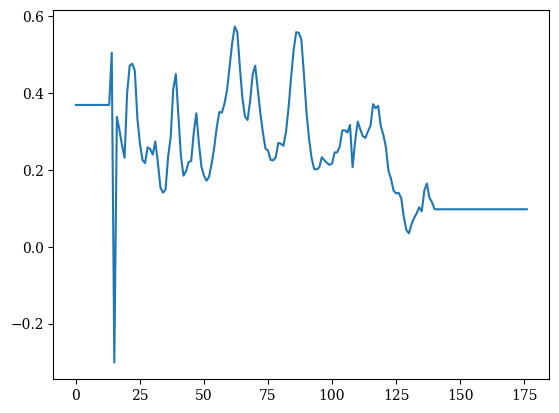

38.49246231155779


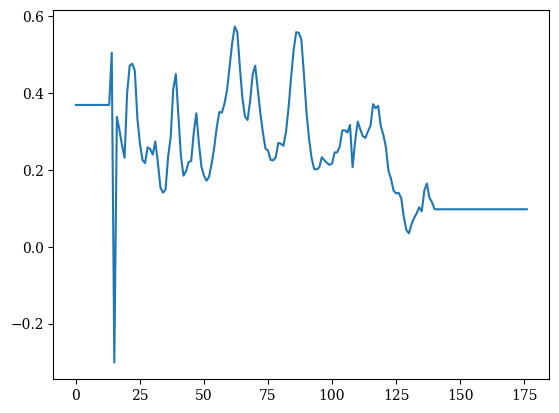

38.74371859296482


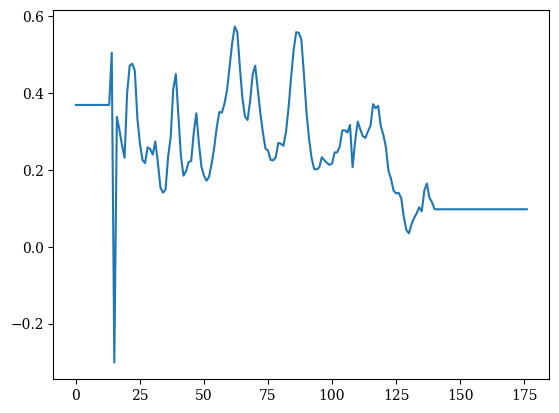

38.994974874371856


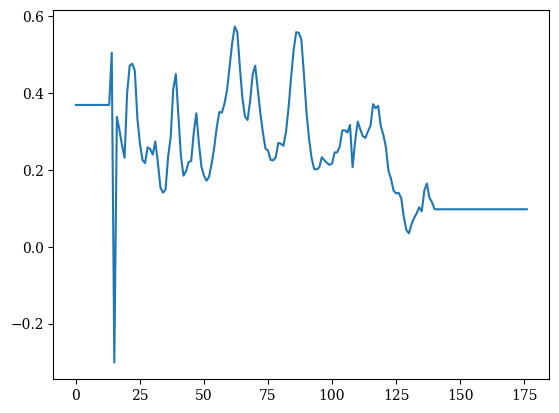

39.24623115577889


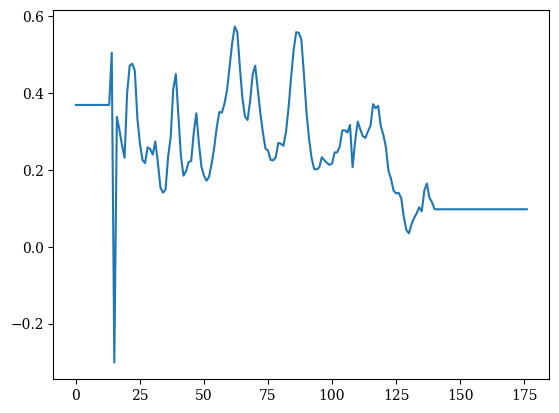

39.497487437185924


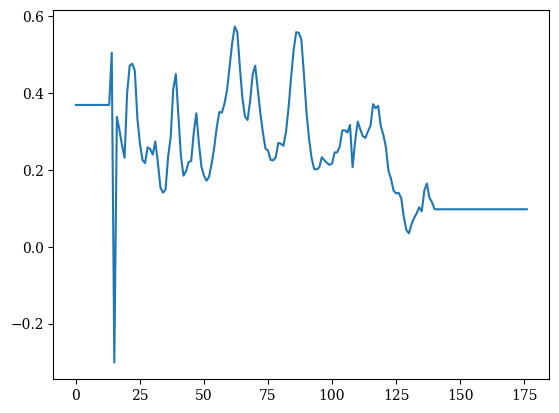

39.74874371859296


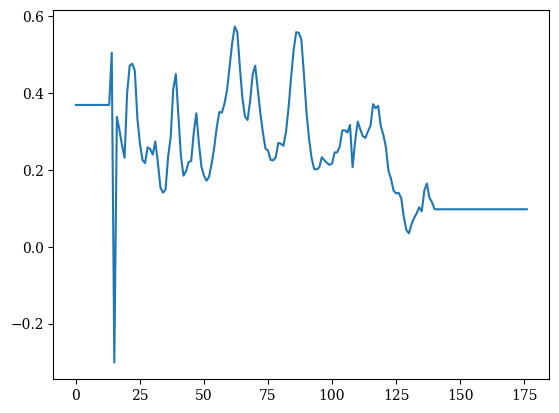

40.0


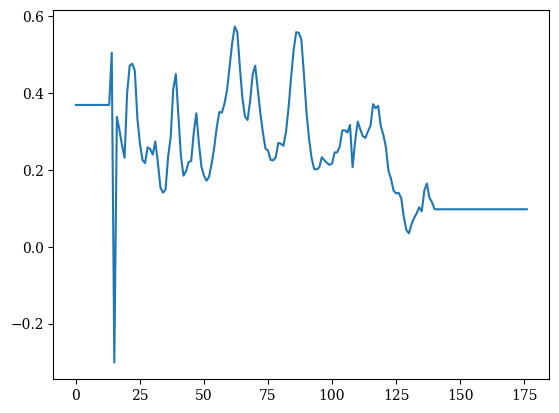

In [127]:
for i,z in enumerate(Z2):
    print (Y2[i][0])
    plt.plot(z)
    plt.show()

In [128]:
spec_arr = spec2d(specnew)
print (spec_arr)
print (np.shape(spec_arr))

177 23
[[-8.02145521e+00  3.05900000e+03  1.26814068e+00  1.91139124e-01]
 [-8.02145521e+00  3.09900000e+03  1.26814068e+00  1.91139124e-01]
 [-8.02145521e+00  3.13900000e+03  1.26814068e+00  1.91139124e-01]
 ...
 [ 3.73914266e+01  1.00190000e+04  9.72561837e-02  1.15656515e+02]
 [ 3.73914266e+01  1.00590000e+04  9.72561837e-02  1.15656515e+02]
 [ 3.73914266e+01  1.00990000e+04  9.72561837e-02  1.15656515e+02]]
(4071, 4)


10.0 400.0
('kernel:k1:log_constant', 'kernel:k2:metric:log_M_0_0', 'kernel:k2:metric:log_M_1_1')
[-0.30287394  2.30258509  5.99146455]
Initial ln-likelihood: -5452.85
      fun: 3219.976543807196
 hess_inv: array([[ 0.0046014 ,  0.00136791,  0.0005933 ],
       [ 0.00136791,  0.005822  , -0.00013595],
       [ 0.0005933 , -0.00013595,  0.00082857]])
      jac: array([4.18328824e-07, 1.22609990e-07, 1.65301941e-07])
  message: 'Optimization terminated successfully.'
     nfev: 22
      nit: 20
     njev: 22
   status: 0
  success: True
        x: array([-1.23792088,  2.86582681,  9.02942484])
Final ln-likelihood: -3219.98


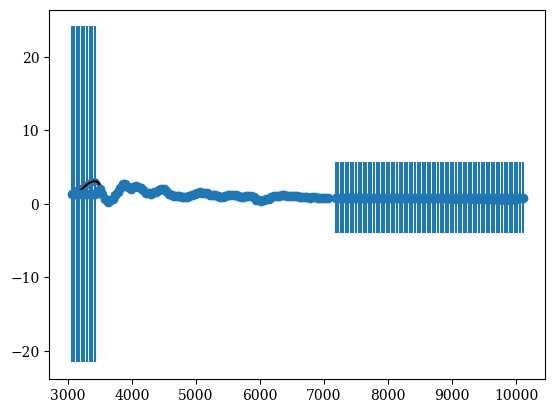

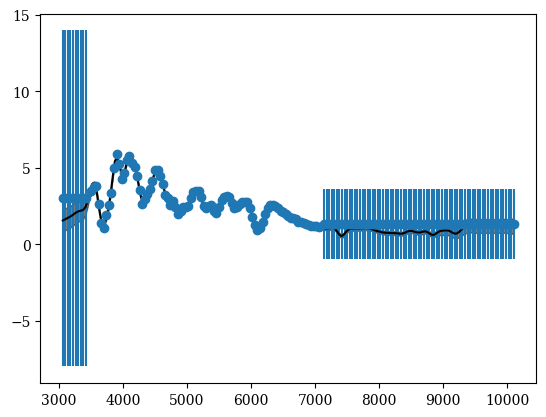

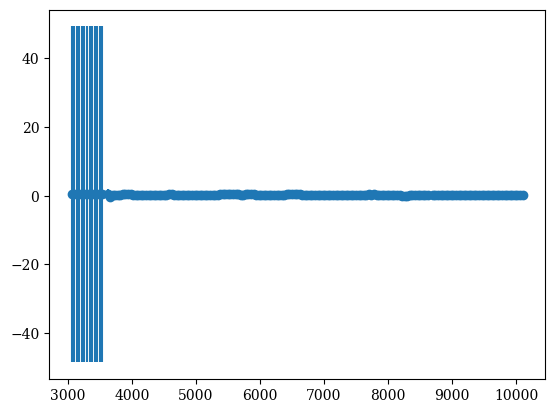

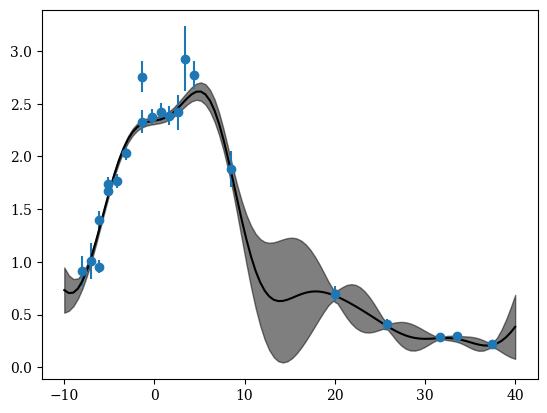

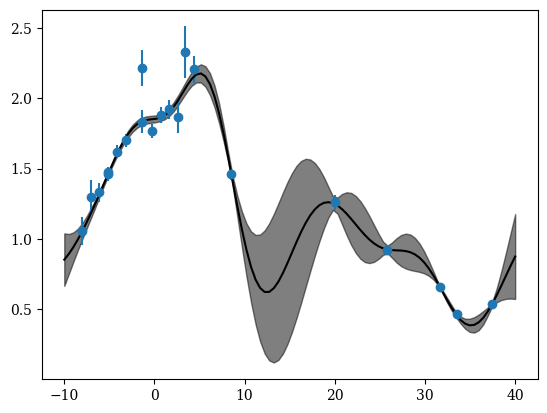

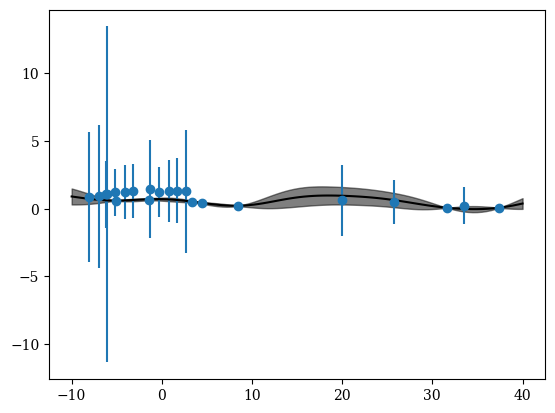

In [129]:
gp, x, y = gp2d.fit_gp_george_2d(spec_arr, phases, waves, printlog=True,plot=True)

In [130]:
phasearr = np.linspace(-10,40,100)
# wavearr = np.linspace(4000,7000,200)
wavearr = np.linspace(waves[0],waves[-1],200)
xv,yv = np.array(np.meshgrid(phasearr,wavearr))
xa = np.stack((xv.ravel(),yv.ravel()),axis=1)
pred_f, pred_var_f = gp.predict(y, xa, return_var=True)

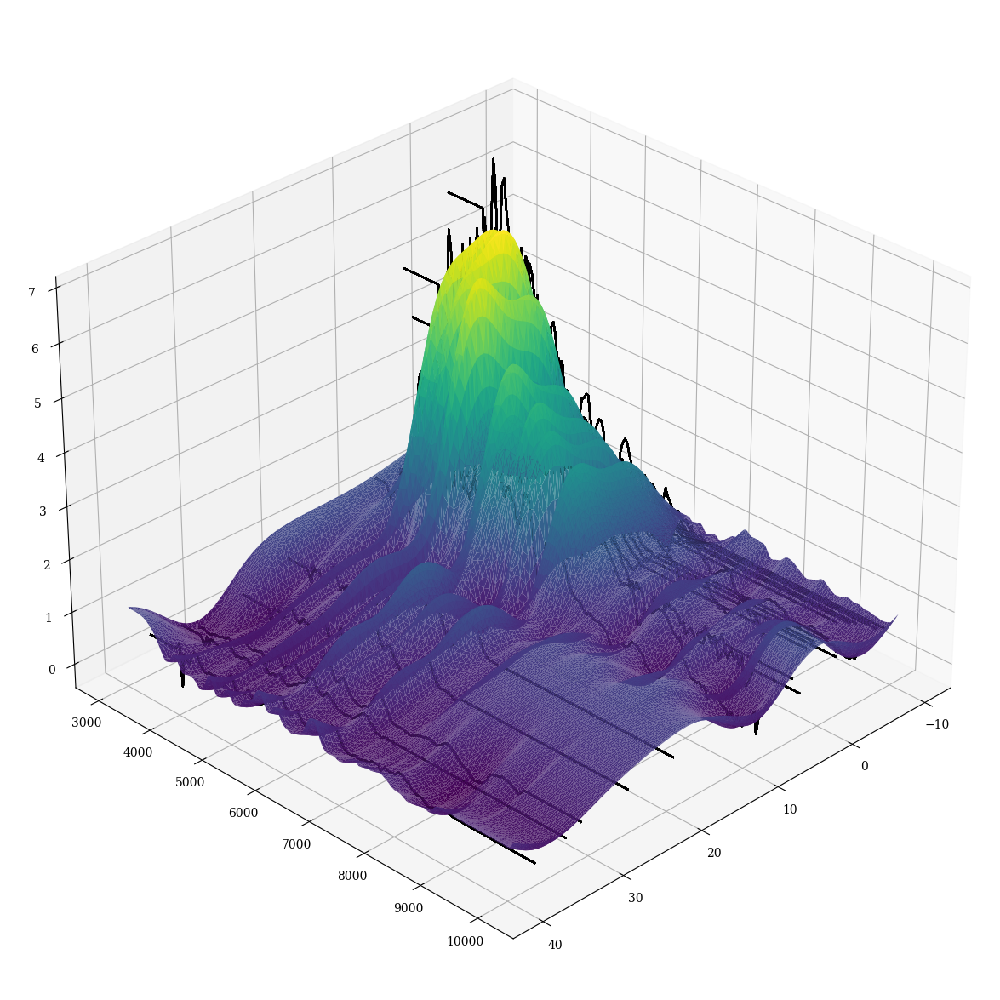

In [131]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(20,15))
# ax = fig.gca(projection='3d')
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(xv.ravel(), yv.ravel(), pred_f,cmap='viridis') 
xphase = x[:,0]
xwave = x[:,1]
for p in xphase:
    idx = np.array(xphase==p)
    idx_zero = np.array(y[idx]!=0)
    p_plot = xphase[idx][idx_zero]
    wave_plot = xwave[idx][idx_zero]
    y_plot = y[idx][idx_zero]
    ax.plot3D(p_plot, wave_plot, y_plot,color = 'k', alpha=.1)
ax.view_init(30, 45)
plt.show()

In [141]:
print (np.shape(xphase))

(3850,)


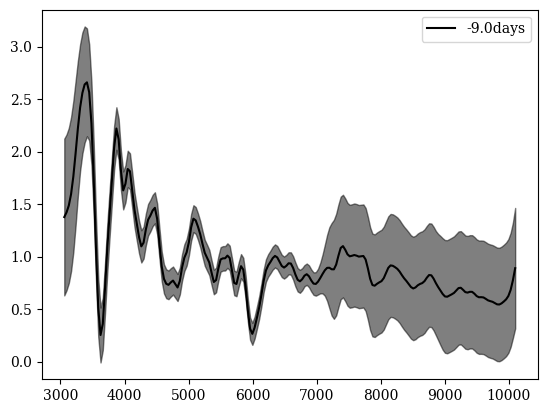

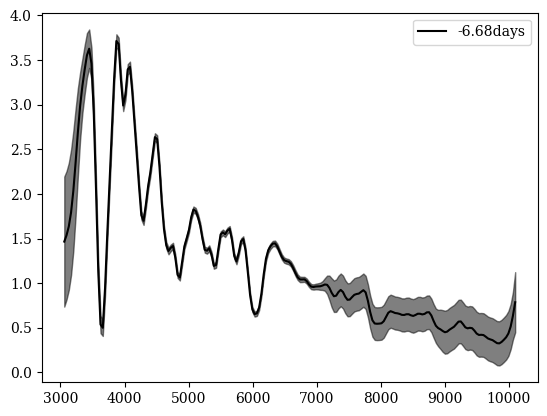

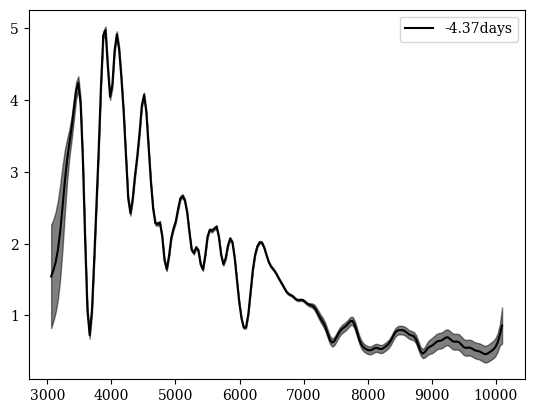

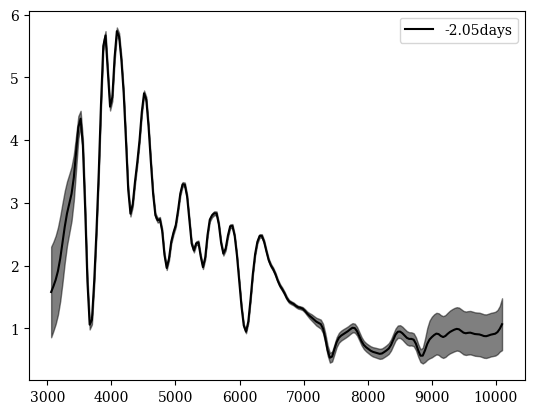

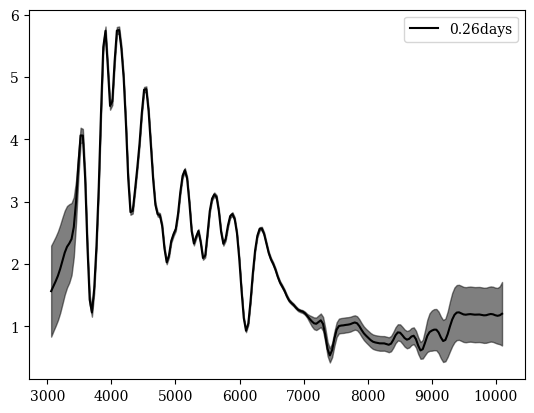

...

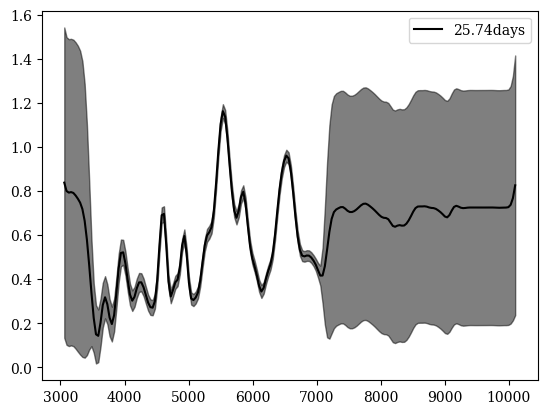

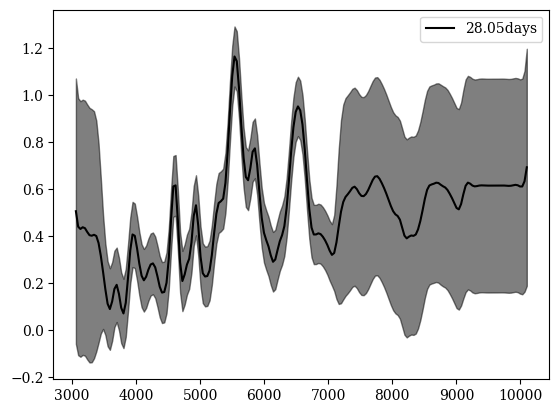

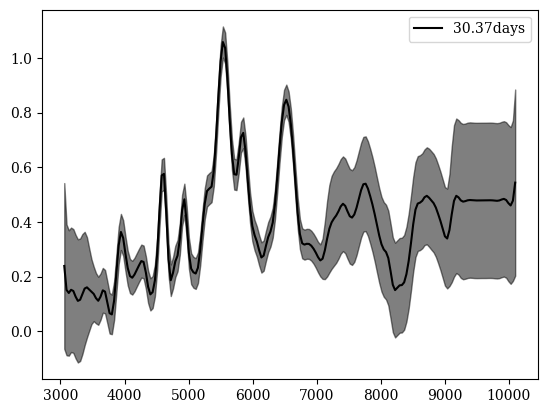

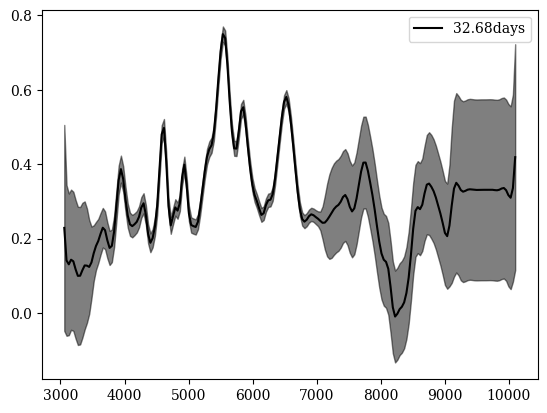

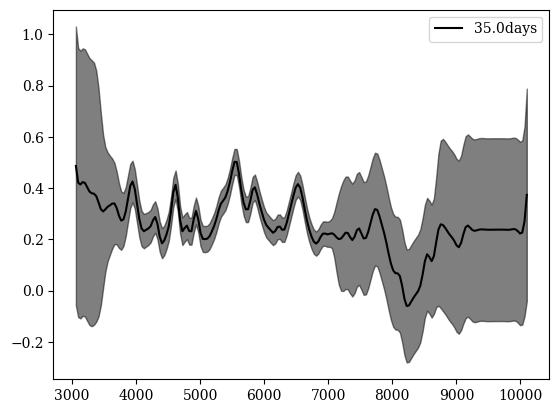

In [132]:
pind = int(len(phases)/2.)
phasearr = np.linspace(-9, 35, 20)
for p in phasearr:
#     wave = np.linspace(4000,7000,200)
    wave = np.linspace(waves[0],waves[-1],200)
    xa = np.vstack([[p]*200,wave]).T
#         print(xa)
    pred_f, pred_var_f = gp.predict(y, xa, return_var=True)
    xphase = x[:,0]
    idx = np.array(xphase==p)
    plt.plot(wave,pred_f,color='k', label = str(np.round(p,2)) + 'days')
    plt.fill_between(wave,pred_f-np.sqrt(pred_var_f),pred_f+np.sqrt(pred_var_f),alpha=0.5,color='k')
    plt.legend()
    plt.show()